<a href="https://colab.research.google.com/github/samirp92/Final-Year-Project-Time-Series-Forecasting-/blob/main/ARIMA_Ele_Power_Consumption_Forecasting_Student_ID_21072112.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import the required libraries

In [1]:
!pip install pmdarima
from IPython import display
display.clear_output()

# Disable warnings in the notebook for maintaining clean output
import warnings
warnings.filterwarnings('ignore')

# Import the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import pmdarima as pm
import statsmodels.api as sm
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from statsmodels.tsa.stattools import adfuller
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [2]:
# Mount the google drive
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

# Set the root path directory
root_path = "/content/drive/MyDrive/Final Year Project"

Mounted at /content/drive


# Data Loading

In [3]:
# Load the data from google drive
df = pd.read_csv("/content/drive/MyDrive/Final Year Project/household_power_consumption.txt", sep=';')
df

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,16/12/2006,17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0
1,16/12/2006,17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0
2,16/12/2006,17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0
3,16/12/2006,17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0
4,16/12/2006,17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0
...,...,...,...,...,...,...,...,...,...
2075254,26/11/2010,20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0
2075255,26/11/2010,20:59:00,0.944,0.0,240.0,4.0,0.0,0.0,0.0
2075256,26/11/2010,21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0
2075257,26/11/2010,21:01:00,0.934,0.0,239.7,3.8,0.0,0.0,0.0


In [4]:
# Display DataFrame information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075259 entries, 0 to 2075258
Data columns (total 9 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Date                   object 
 1   Time                   object 
 2   Global_active_power    object 
 3   Global_reactive_power  object 
 4   Voltage                object 
 5   Global_intensity       object 
 6   Sub_metering_1         object 
 7   Sub_metering_2         object 
 8   Sub_metering_3         float64
dtypes: float64(1), object(8)
memory usage: 142.5+ MB


In [5]:
# Check Summary statistics
df.describe(include='all')

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
count,2075259,2075259,2075259,2075259,2075259,2075259,2075259,2075259,2.049280e+06
unique,1442,1440,6534,896,5168,377,153,145,NaN
top,6/12/2008,17:24:00,?,0.000,?,1.000,0.000,0.000,NaN
freq,1440,1442,25979,472786,25979,169406,1840611,1408274,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.458447e+00
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.437154e+00
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000e+00
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.700000e+01


# Data Preprocessing

In [6]:
# Replace '?' with NaN values
df.replace('?', np.nan, inplace=True)

In [7]:
# Convert numeric columns to appropriate data types
df['Global_active_power'] = pd.to_numeric(df['Global_active_power'], errors='coerce')
df['Global_reactive_power'] = pd.to_numeric(df['Global_reactive_power'], errors='coerce')
df['Voltage'] = pd.to_numeric(df['Voltage'], errors='coerce')
df['Global_intensity'] = pd.to_numeric(df['Global_intensity'], errors='coerce')
df['Sub_metering_1'] = pd.to_numeric(df['Sub_metering_1'], errors='coerce')
df['Sub_metering_2'] = pd.to_numeric(df['Sub_metering_2'], errors='coerce')

# Confirm the updated data types
print(df.dtypes)

Date                      object
Time                      object
Global_active_power      float64
Global_reactive_power    float64
Voltage                  float64
Global_intensity         float64
Sub_metering_1           float64
Sub_metering_2           float64
Sub_metering_3           float64
dtype: object


In [8]:
# Convert the 'Date' and 'Time' columns to a single 'date_time' column
df['date_time'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])

# Convert the 'date_time' column to datetime format
df['date_time'] = pd.to_datetime(df['date_time'])

# Set the 'date_time' column as the index
df.set_index('date_time', inplace=True)

# Drop the original 'Date' and 'Time' columns
df.drop(columns=['Date', 'Time'], inplace=True)

# Copy the original DataFrame into a new DataFrame
df_copy = df.copy()
df_copy

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
date_time,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0
...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.000,240.43,4.0,0.0,0.0,0.0
2010-11-26 20:59:00,0.944,0.000,240.00,4.0,0.0,0.0,0.0
2010-11-26 21:00:00,0.938,0.000,239.82,3.8,0.0,0.0,0.0


# Data Imputation

In [9]:
# Check Missing Values
df.isnull().sum()

,0
Global_active_power,25979
Global_reactive_power,25979
Voltage,25979
Global_intensity,25979
Sub_metering_1,25979
Sub_metering_2,25979
Sub_metering_3,25979


In [10]:
# Apply MICE imputer
imputer = IterativeImputer(random_state=0)
df_imputed = imputer.fit_transform(df)

# Convert back to DataFrame
df_imputed = pd.DataFrame(df_imputed, index=df.index, columns=df.columns)

In [11]:
#Check Missing Values after imputation
df_imputed.isnull().sum()

,0
Global_active_power,0
Global_reactive_power,0
Voltage,0
Global_intensity,0
Sub_metering_1,0
Sub_metering_2,0
Sub_metering_3,0


# EDA

In [12]:
# Define a function to plot the visualization, distribution and correlation of resampled data
def df_visu_dist_corr(dataset, resample_type, title):

  # Resample the data
  df_resampled = dataset.resample(resample_type).mean()

  print('Shape after %s resampling of data : %s ' %(title, df_resampled.shape))

  # Plot Resampled Data set
  df_resampled.plot(subplots=True, figsize=(30,20))
  plt.suptitle("Visualization of %s resampled Data" %title, fontsize=30, color='blue')
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.show()

  # Plot distribution
  print(' \n\n************************************************ %s Resampled distribution Plot **************************************************' %title, end="\n\n")
  df_resampled.hist(figsize=(15, 10), bins=50)
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.gcf().set_dpi(300)
  plt.show()

  # Plot correlation plot
  print(' \n\n************************************************ %s Resampled correlation Plot **************************************************' %title, end="\n\n")
  plt.figure(figsize=(10,6))
  sns.heatmap(df_resampled.corr(), annot=True, fmt=".2f")
  plt.show()

# Hourly Power Comsumption Forecasting

In [13]:
# Resampled the data
hourly_resampled = df_imputed.resample('H').mean()

# Make new data frame with univariate feature (Global_active_power)
df1 = hourly_resampled[['Global_active_power']]
df1

,Global_active_power
date_time,
2006-12-16 17:00:00,4.222889
2006-12-16 18:00:00,3.632200
2006-12-16 19:00:00,3.400233
2006-12-16 20:00:00,3.268567
2006-12-16 21:00:00,3.056467
...,...
2010-11-26 17:00:00,1.725900
2010-11-26 18:00:00,1.573467
2010-11-26 19:00:00,1.659333


## EDA

Shape after Hourly resampling of data : (34589, 7) 


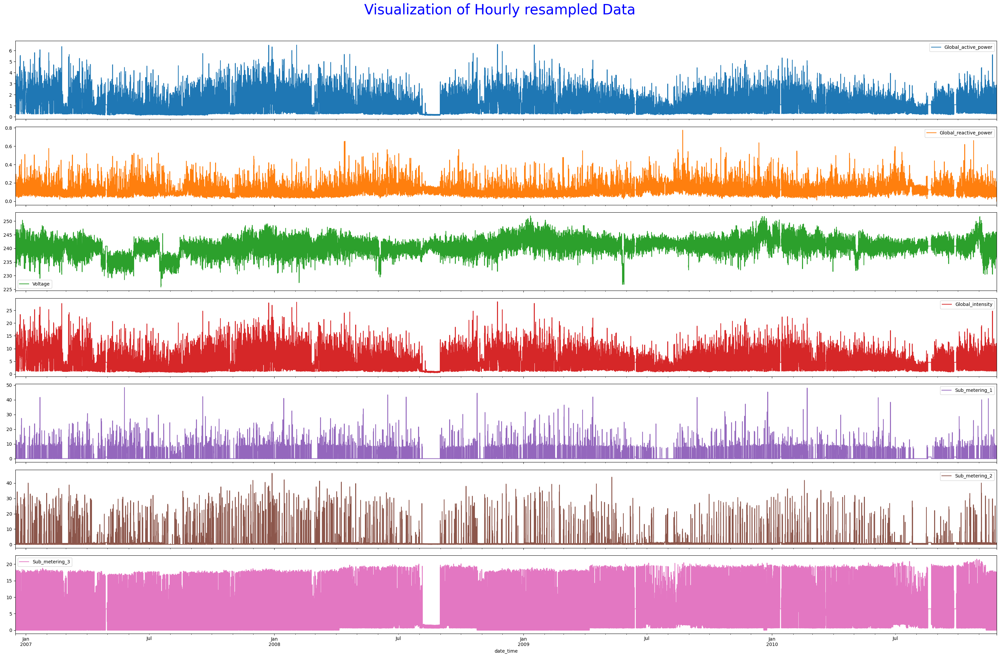

 

************************************************ Hourly Resampled distribution Plot **************************************************



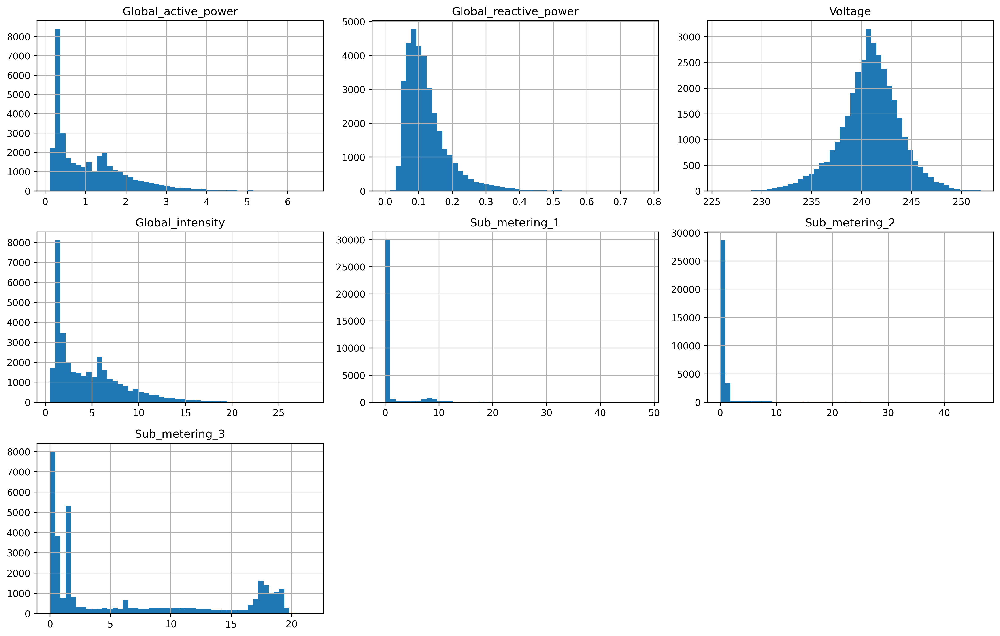

 

************************************************ Hourly Resampled correlation Plot **************************************************



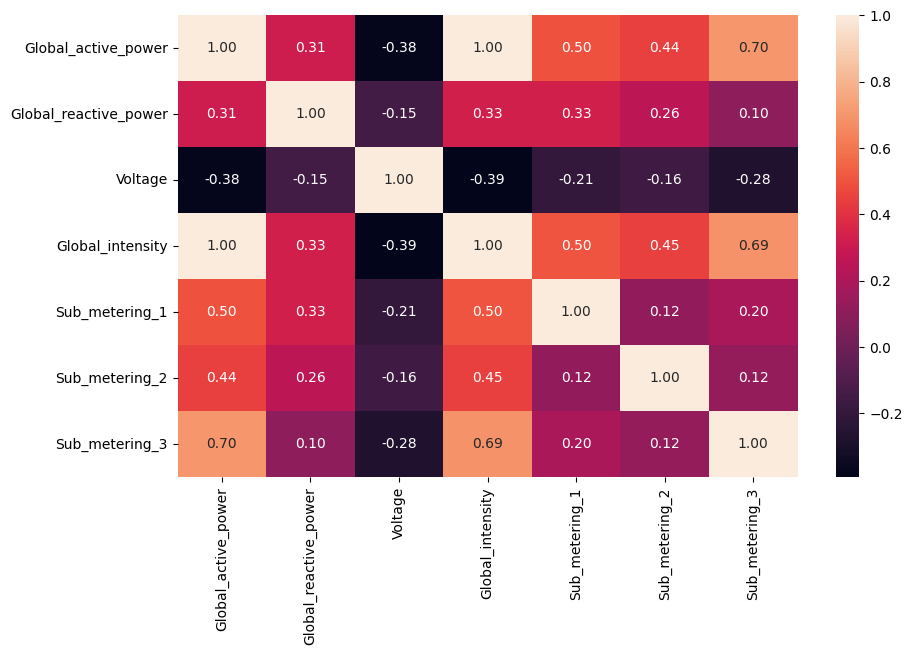

In [ ]:
# Plot the visualization, distribution and correlation of Hourly resampled data
df_visu_dist_corr(df_imputed, "H", "Hourly")

## Decompose the data

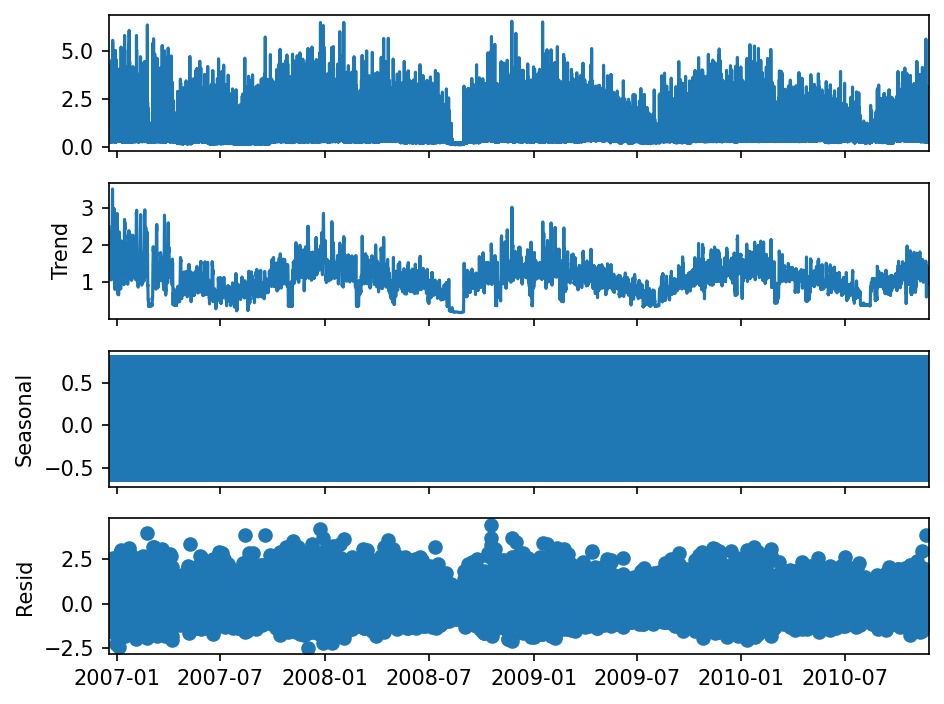

In [ ]:
# data decomposition
hourly_decomp = seasonal_decompose(df1, model='Additive')
hourly_decomp.plot()
plt.gcf().set_dpi(150)
plt.show()

## Stationarity check

In [ ]:
# Define a fuction to test the stationarity
def stationarity_test(df, resample_type):

  # Calculate rolling mean and standard deviation
  moving_Average = df.rolling(window=24).mean()
  moving_STD = df.rolling(window=24).std()

  # Plot the graph
  plt.figure(figsize=(20,5))
  sns.despine(left=True)
  orig = plt.plot(df, color='purple',label='Original')
  mean = plt.plot(moving_Average, color='yellow', label='Rolling Mean')
  std = plt.plot(moving_STD, color='cyan', label = 'Rolling Std')
  plt.legend(loc='best')
  plt.title('Rolling Mean & Standard Deviation of %s Resampled Data' %resample_type)
  plt.show()

  # Adfuller test
  print('\nResults of Augmented Dickey-Fuller test:')
  ADF_result = adfuller(df, autolag='AIC')
  output = pd.Series(ADF_result[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
  for key,value in ADF_result[4].items():
    output['Critical Value (%s)'%key] = value
  print(output)


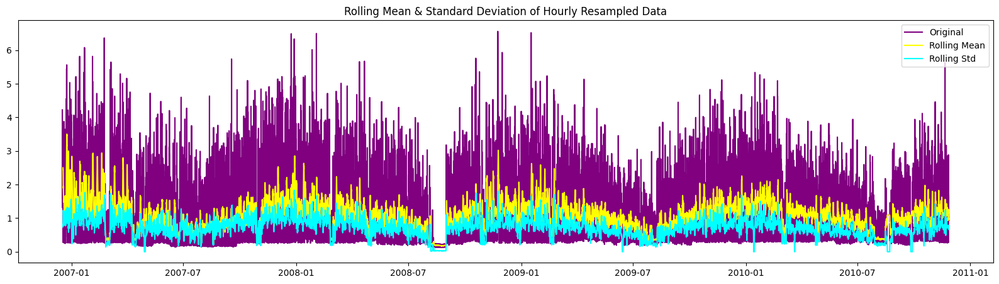


Results of Augmented Dickey-Fuller test:
Test Statistic                -1.436949e+01
p-value                        9.547270e-27
#Lags Used                     5.100000e+01
Number of Observations Used    3.453700e+04
Critical Value (1%)           -3.430539e+00
Critical Value (5%)           -2.861624e+00
Critical Value (10%)          -2.566815e+00
dtype: float64


In [ ]:
stationarity_test(df1, 'Hourly')

Observation:-
+ time series is stationary.

## Train & Test Split

In [14]:
# Split the data into Train & Test Split
train_size = int(len(df1) * 0.80)
train_df1 = df1[:train_size]
test_df1 = df1[train_size:]

# Check the shape of Train & Test Split
train_df1.shape, test_df1.shape

((27671, 1), (6918, 1))

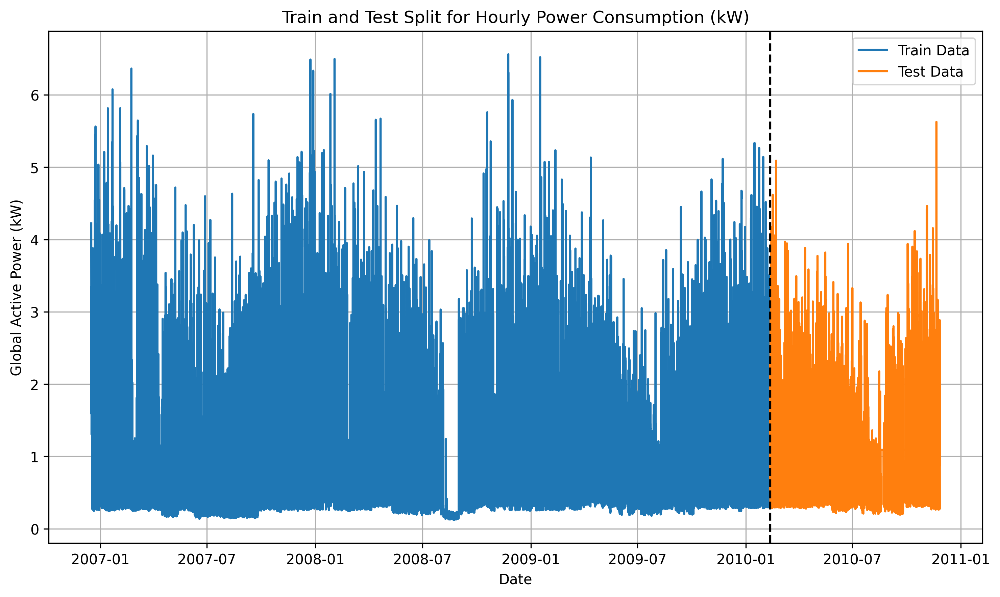

In [ ]:
# Plot train & test monthly data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(train_df1.Global_active_power  , label='Train Data')
plt.plot(test_df1.Global_active_power, label='Test Data')
plt.axvline(test_df1.index[0], color='black', linestyle='--')
plt.title('Train and Test Split for Hourly Power Consumption (kW)')
plt.xlabel('Date')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()

## ACF and PACF plot

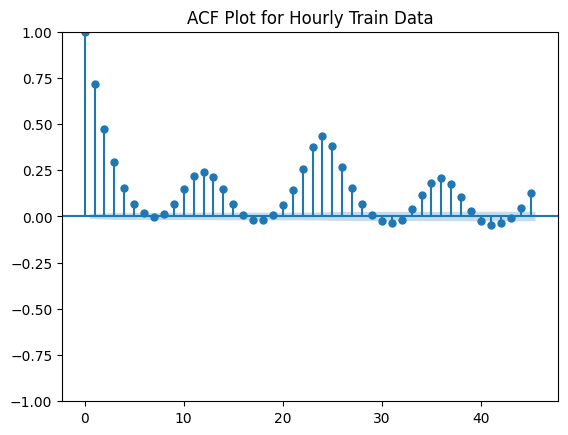

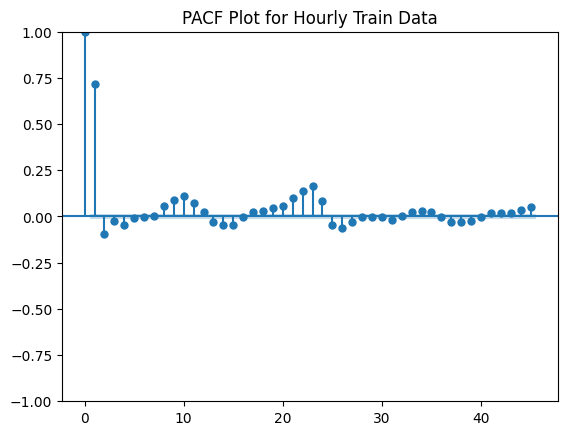

In [ ]:
# Plot ACF and PACF graphs
plot_acf(train_df1, title='ACF Plot for Hourly Train Data')
plot_pacf(train_df1, title='PACF Plot for Hourly Train Data')
plt.show()

## ARIMA

### Auto ARIMA model

In [ ]:
# Auto_ARIMA model
Auto_ARIMA_model = pm.auto_arima(df1['Global_active_power'], suppress_warnings=True, trace=True)

# Summary of Auto ARIMA model
Auto_ARIMA_model.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=55.21 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=71014.898, Time=2.33 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=70859.570, Time=1.72 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=70803.229, Time=4.38 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=71012.899, Time=0.53 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=46.64 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=69733.924, Time=9.42 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=60.57 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=66366.580, Time=37.84 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=64863.943, Time=57.36 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=83.01 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=69.33 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=77.20 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=90.05 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=inf, Time=

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                34589
Model:               SARIMAX(1, 1, 3)   Log Likelihood              -32425.972
Date:                Mon, 26 Aug 2024   AIC                          64863.943
Time:                        22:14:22   BIC                          64914.651
Sample:                    12-16-2006   HQIC                         64880.104
                         - 11-26-2010                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -1.617e-05   9.61e-05     -0.168      0.866      -0.000       0.000
ar.L1          0.4954      0.011     45.995      0.000       0.474       0.517
ma.L1         -0.7363      0.011    -64.241      0.000      -0.759      -0.714
ma.L2         -0.1516      0.006    -24.327      0.000      -0.164      -0.139
ma.L3         -0.0897      0.008    -11.505      0.000      -0.105      -0.074
sigma2         0.3817      0.002    177.483      0.000       0.378       0.386
===================================================================================
Ljung-Box (L1) (Q):                   0.40   Jarque-Bera (JB):             22638.00
Prob(Q):                              0.53   Prob(JB):                         0.00
Heteroskedasticity (H):               0.70   Skew:                             1.12
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.27
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Grid search for finding optimal value of ARIMA para p,d,q wrt lowest AIC

In [ ]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 8)
d_values = range(0, 2)
q_values = range(0, 6)

best_aic = np.inf
best_order = None

# Iterate over all combinations
pdq = list(itertools.product(p_values,d_values,q_values))

for combinations in pdq:
    try:
        ARIMA_model = ARIMA(train_df1,order=combinations)
        ARIMA_model_fit = ARIMA_model.fit()
        print(f'ARIMA{combinations} - AIC:{ARIMA_model_fit.aic}')

        if ARIMA_model_fit.aic < best_aic:
            best_aic = ARIMA_model_fit.aic
            best_order = combinations
    except:
        continue

print(f'\nBest ARIMA{best_order} - AIC:{best_aic}')

ARIMA(0, 0, 0) - AIC:74403.53685151
ARIMA(0, 0, 1) - AIC:60141.64022160639
ARIMA(0, 0, 2) - AIC:56212.546744730615
ARIMA(0, 0, 3) - AIC:54649.23321381232
ARIMA(0, 0, 4) - AIC:54123.01942813565
ARIMA(0, 0, 5) - AIC:54022.60239984519
ARIMA(0, 1, 0) - AIC:58401.22140108337
ARIMA(0, 1, 1) - AIC:58264.226930157696
ARIMA(0, 1, 2) - AIC:57465.97910552617
ARIMA(0, 1, 3) - AIC:54842.64456769027
ARIMA(0, 1, 4) - AIC:53685.779585236996
ARIMA(0, 1, 5) - AIC:53363.57601928874
ARIMA(1, 0, 0) - AIC:54231.29196218716
ARIMA(1, 0, 1) - AIC:54012.1799383318
ARIMA(1, 0, 2) - AIC:53999.771138475815
ARIMA(1, 0, 3) - AIC:53948.849423045576
ARIMA(1, 0, 4) - AIC:53942.69384285577
ARIMA(1, 0, 5) - AIC:53360.55991939767
ARIMA(1, 1, 0) - AIC:58300.070312116964
ARIMA(1, 1, 1) - AIC:53806.50056772707
ARIMA(1, 1, 2) - AIC:53489.52056846701
ARIMA(1, 1, 3) - AIC:53446.37430798831
ARIMA(1, 1, 4) - AIC:53353.520516180695
ARIMA(1, 1, 5) - AIC:53330.930482788346
ARIMA(2, 0, 0) - AIC:53997.18205614641
ARIMA(2, 0, 1) - AIC:

### ARIMA model with best pdq value order= (6,1,5)

In [ ]:
# ARIMA model
ARIMA_model = ARIMA(train_df1, order= (6,1,5))
ARIMA_model_fit = ARIMA_model.fit()
pred_test = ARIMA_model_fit.predict(start=test_df1.index[0], end=test_df1.index[-1])

# Calculate evaluation metrics
print(f'\nTest MAE: {mean_absolute_error(test_df1.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df1.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df1.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df1.Global_active_power, pred_test)):.3f}')


Test MAE: 0.731
Test MAPE: 1.500
Test MSE: 0.718
Test RMSE: 0.848


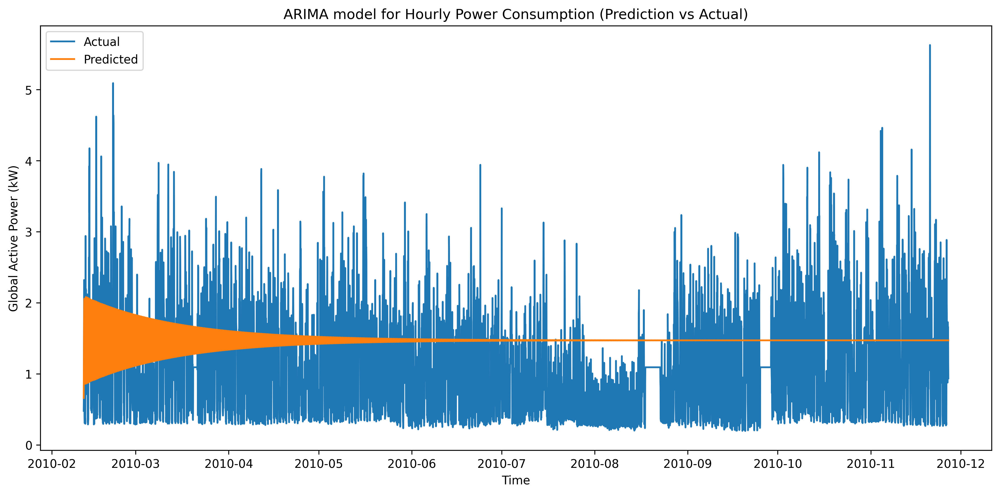

In [ ]:
# Plot the results for ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(test_df1, label='Actual')
plt.plot(pred_test, label='Predicted')
plt.title('ARIMA model for Hourly Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

### Grid search for finding optimal value of ARIMA para p,d,q wrt lowest test RMSE

In [ ]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 8)
d_values = range(0, 2)
q_values = range(0, 6)

best_RMSE = np.inf
best_order = None

# Iterate over all combinations
pdq = list(itertools.product(p_values, d_values, q_values))

# Perform grid search
for combinations in pdq:
    try:
        # Initialize and fit the ARIMA model
        ARIMA_model = ARIMA(train_df1, order=combinations)
        ARIMA_model_fit = ARIMA_model.fit()
        pred_test = ARIMA_model_fit.predict(start=test_df1.index[0], end=test_df1.index[-1])

        # Test RMSE
        test_rmse = np.sqrt(mean_squared_error(test_df1, pred_test))
        print(f'ARIMA{combinations} - RMSE: {test_rmse}')

        # Update the best RMSE and order
        if test_rmse < best_RMSE:
            best_RMSE = test_rmse
            best_order = combinations

    except:
        continue

# Print best model
print(f'\nBest ARIMA{best_order} - RMSE: {best_RMSE}')

ARIMA(0, 0, 0) - RMSE: 0.730991140354487
ARIMA(0, 0, 1) - RMSE: 0.7309706554959021
ARIMA(0, 0, 2) - RMSE: 0.7309661456974486
ARIMA(0, 0, 3) - RMSE: 0.7309555673966424
ARIMA(0, 0, 4) - RMSE: 0.7309595064883664
ARIMA(0, 0, 5) - RMSE: 0.7309792864002168
ARIMA(0, 1, 0) - RMSE: 0.9733460566177701
ARIMA(0, 1, 1) - RMSE: 0.973318254993881
ARIMA(0, 1, 2) - RMSE: 0.8389806952512333
ARIMA(0, 1, 3) - RMSE: 0.8400263968227812
ARIMA(0, 1, 4) - RMSE: 0.8640770501678084
ARIMA(0, 1, 5) - RMSE: 0.8711136807640845
ARIMA(1, 0, 0) - RMSE: 0.7310369256756791
ARIMA(1, 0, 1) - RMSE: 0.7310228009322266
ARIMA(1, 0, 2) - RMSE: 0.731012363603571
ARIMA(1, 0, 3) - RMSE: 0.7310139724076326
ARIMA(1, 0, 4) - RMSE: 0.7310307144080107
ARIMA(1, 0, 5) - RMSE: 0.7495967701053181
ARIMA(1, 1, 0) - RMSE: 0.9753240277829349
ARIMA(1, 1, 1) - RMSE: 0.8734214553125318
ARIMA(1, 1, 2) - RMSE: 0.8742249356883166
ARIMA(1, 1, 3) - RMSE: 0.8740615261970947
ARIMA(1, 1, 4) - RMSE: 0.8734589174259038
ARIMA(1, 1, 5) - RMSE: 0.873135439985

### ARIMA model with best pdq value order= (5,0,5)

In [ ]:
# ARIMA model
ARIMA_model = ARIMA(train_df1, order= (5,0,5))
ARIMA_model_fit = ARIMA_model.fit()
pred_test = ARIMA_model_fit.predict(start=test_df1.index[0], end=test_df1.index[-1])

# Calculate evaluation metrics
print(f'\nTest MAE: {mean_absolute_error(test_df1.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df1.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df1.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df1.Global_active_power, pred_test)):.3f}')


Test MAE: 0.571
Test MAPE: 0.990
Test MSE: 0.486
Test RMSE: 0.697


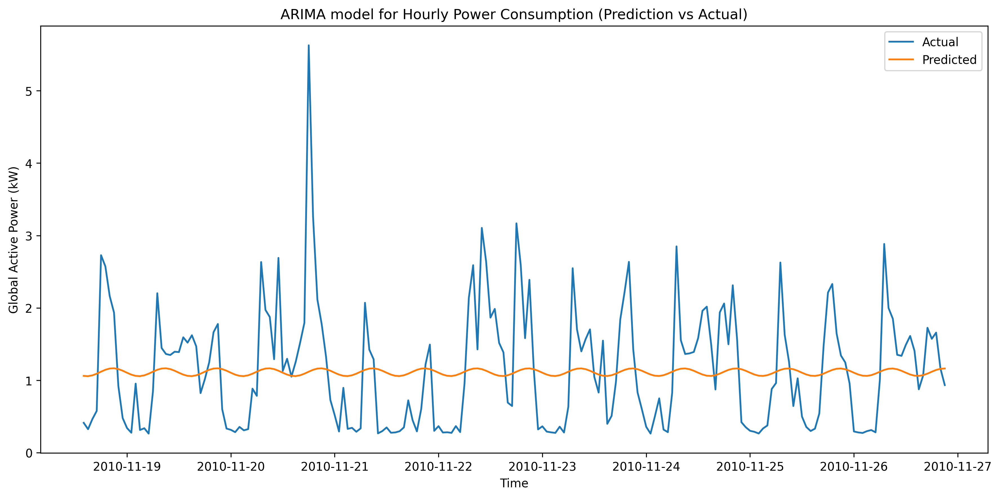

In [ ]:
# Plot the results for ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(test_df1[-200:], label='Actual')
plt.plot(pred_test[-200:], label='Predicted')
plt.title('ARIMA model for Hourly Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

## Seasonal ARIMA

### Grid search for finding optimal value of SARIMA para P, D, Q, m

In [15]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 3)
d_values = range(0, 1)
q_values = range(0, 3)

# Define the P, D, Q, m ranges for the seasonal part
P_values = range(0, 2)
D_values = range(0, 1)
Q_values = range(0, 2)
m = [24]

# Variables to store the best RMSE and orders
best_rmse = np.inf
best_nonseasonal_order = None
best_seasonal_order = None

# Combinations of (p, d, q) for non-seasonal part
pdq = list(itertools.product(p_values, d_values, q_values))

# Combinations of (P, D, Q, m) for seasonal part
seasonal_pdq = list(itertools.product(P_values, D_values, Q_values, m))

# Gride Search
for combinations in pdq:
    for seasonal_combinations in seasonal_pdq:
        try:
            SARIMA_model = SARIMAX(train_df1, order=combinations, seasonal_order=seasonal_combinations)
            SARIMA_model_fit = SARIMA_model.fit(disp=False)
            test_pred = SARIMA_model_fit.forecast(steps=len(test_df1))
            rmse = np.sqrt(mean_squared_error(test_df1, test_pred))
            print(f'SARIMA{combinations}x{seasonal_combinations} - RMSE: {rmse}')

            # best RMSE and orders
            if rmse < best_rmse:
                best_rmse = rmse
                best_nonseasonal_order = combinations
                best_seasonal_order = seasonal_combinations
        except:
            continue

# Print best model
print(f'\nBest SARIMA{best_nonseasonal_order}x{best_seasonal_order} - RMSE: {best_rmse}')

SARIMA(0, 0, 0)x(0, 0, 0, 24) - RMSE: 1.2409431158703579
SARIMA(0, 0, 0)x(0, 0, 1, 24) - RMSE: 1.240048740873916
SARIMA(0, 0, 0)x(1, 0, 0, 24) - RMSE: 1.2283054839241512
SARIMA(0, 0, 0)x(1, 0, 1, 24) - RMSE: 0.7475268257925834
SARIMA(0, 0, 1)x(0, 0, 0, 24) - RMSE: 1.240935786461854
SARIMA(0, 0, 1)x(0, 0, 1, 24) - RMSE: 1.2400373583271536
SARIMA(0, 0, 1)x(1, 0, 0, 24) - RMSE: 1.2334478234095474
SARIMA(0, 0, 1)x(1, 0, 1, 24) - RMSE: 0.745841520602413
SARIMA(0, 0, 2)x(0, 0, 0, 24) - RMSE: 1.2409174553504367
SARIMA(0, 0, 2)x(0, 0, 1, 24) - RMSE: 1.2400752222513045
SARIMA(0, 0, 2)x(1, 0, 0, 24) - RMSE: 1.2358930309101712
SARIMA(0, 0, 2)x(1, 0, 1, 24) - RMSE: 0.7352165493005252
SARIMA(1, 0, 0)x(0, 0, 0, 24) - RMSE: 1.240626052562025
SARIMA(1, 0, 0)x(0, 0, 1, 24) - RMSE: 1.2401538001155779
SARIMA(1, 0, 0)x(1, 0, 0, 24) - RMSE: 1.2393006792674364
SARIMA(1, 0, 1)x(0, 0, 0, 24) - RMSE: 1.2406226910066451
SARIMA(1, 0, 1)x(0, 0, 1, 24) - RMSE: 1.2401282800057463
SARIMA(1, 0, 1)x(1, 0, 0, 24) - RMS

### Seasonal ARIMA model with best pdq value order=(1,0,2), seasonal_order=(1,0,1,24)

In [16]:
# Seasonal ARIMA model
Seasonal_ARIMA_model = SARIMAX(train_df1, order=(1,0,2), seasonal_order=(1,0,1,24))
Seasonal_ARIMA_model_fit = Seasonal_ARIMA_model.fit()
pred_train = Seasonal_ARIMA_model_fit.predict(start=train_df1.index[0], end=train_df1.index[-1])
pred_test = Seasonal_ARIMA_model_fit.predict(start=test_df1.index[0], end=test_df1.index[-1])

print(f'\nTest MAE: {mean_absolute_error(test_df1.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df1.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df1.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df1.Global_active_power, pred_test)):.3f}')


Test MAE: 0.524
Test MAPE: 0.869
Test MSE: 0.480
Test RMSE: 0.693


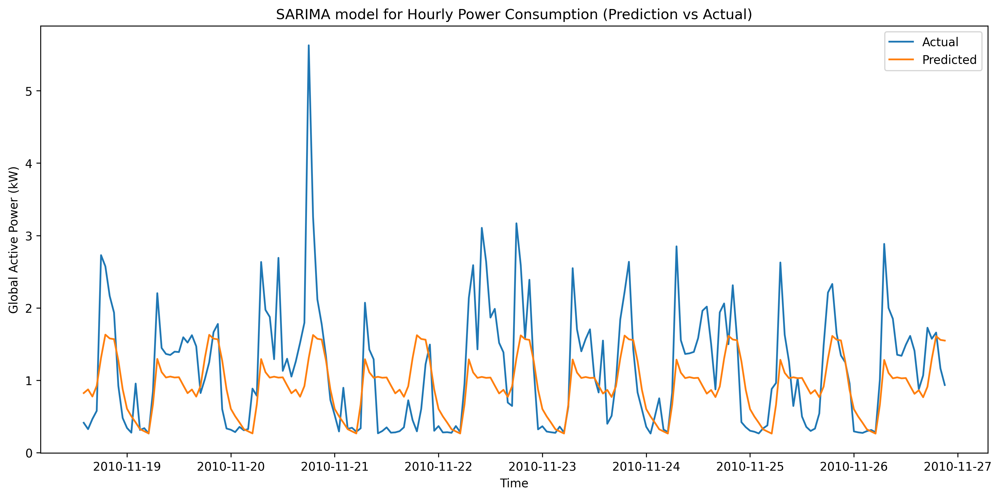

In [18]:
#  Plot the results for Seasonal ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(test_df1[-200:], label='Actual')
plt.plot(pred_test[-200:], label='Predicted')
plt.title('SARIMA model for Hourly Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

# Daily Power Comsumption Forecasting

In [19]:
# Resampled the data
daily_resampled = df_imputed.resample('D').mean()

# Make new data frame with univariate feature (Global_active_power)
df2 = daily_resampled[['Global_active_power']]
df2

,Global_active_power
date_time,
2006-12-16,3.053475
2006-12-17,2.354486
2006-12-18,1.530435
2006-12-19,1.157079
2006-12-20,1.545658
...,...
2010-11-22,1.417733
2010-11-23,1.095511
2010-11-24,1.247394


## EDA

Shape after Daily resampling of data : (1442, 7) 


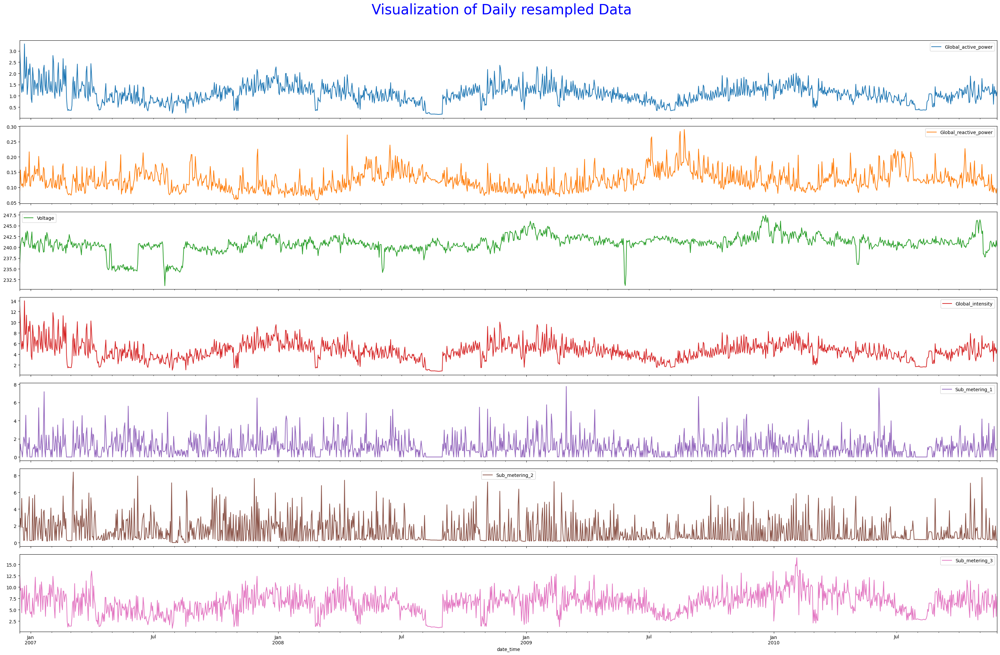

 

************************************************ Daily Resampled distribution Plot **************************************************



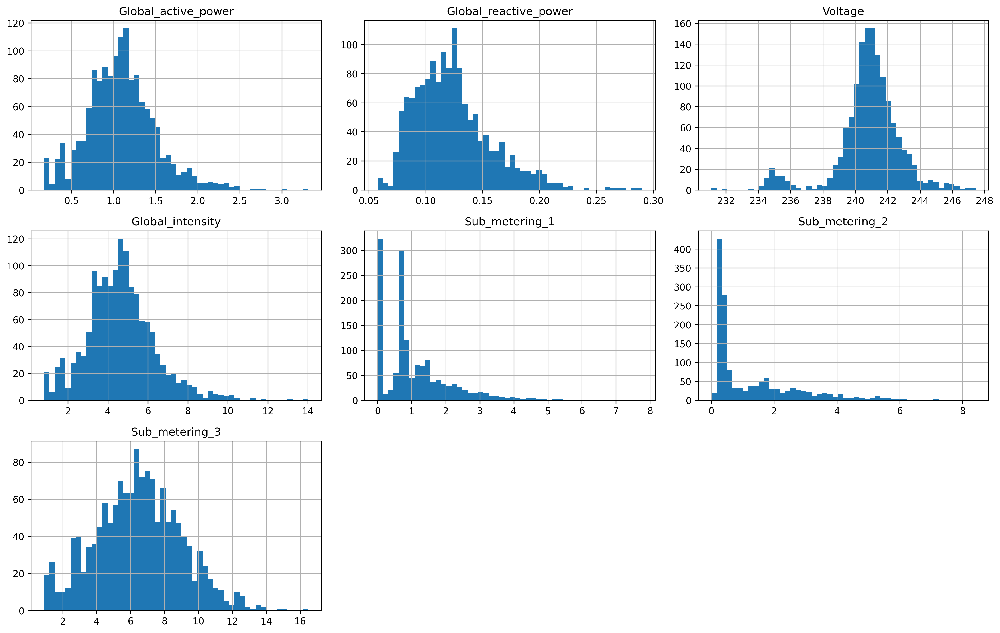

 

************************************************ Daily Resampled correlation Plot **************************************************



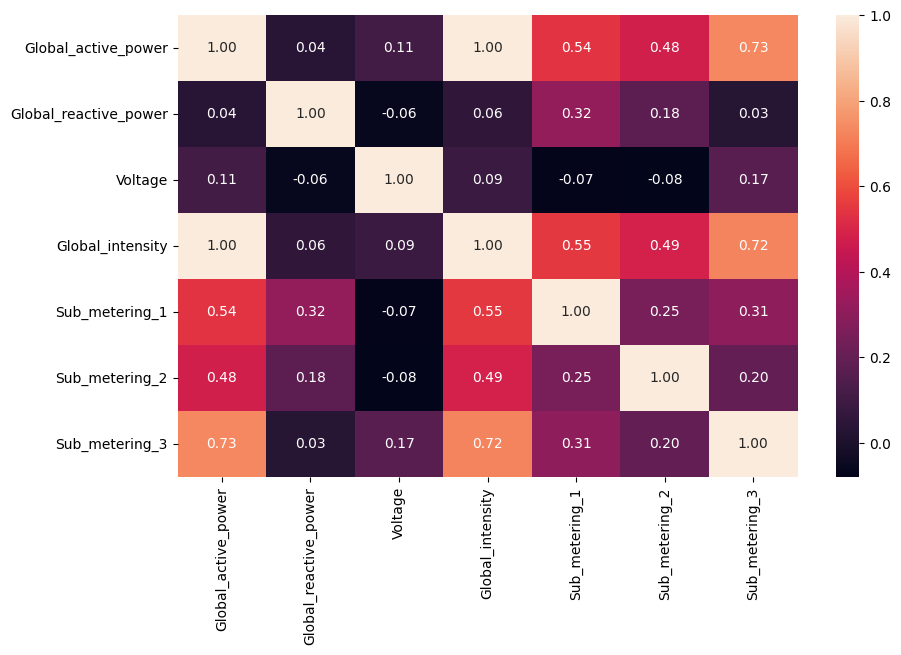

In [ ]:
# Plot the visualization, distribution and correlation of Hourly resampled data
df_visu_dist_corr(df_imputed, "D", "Daily")

## Decompose the data

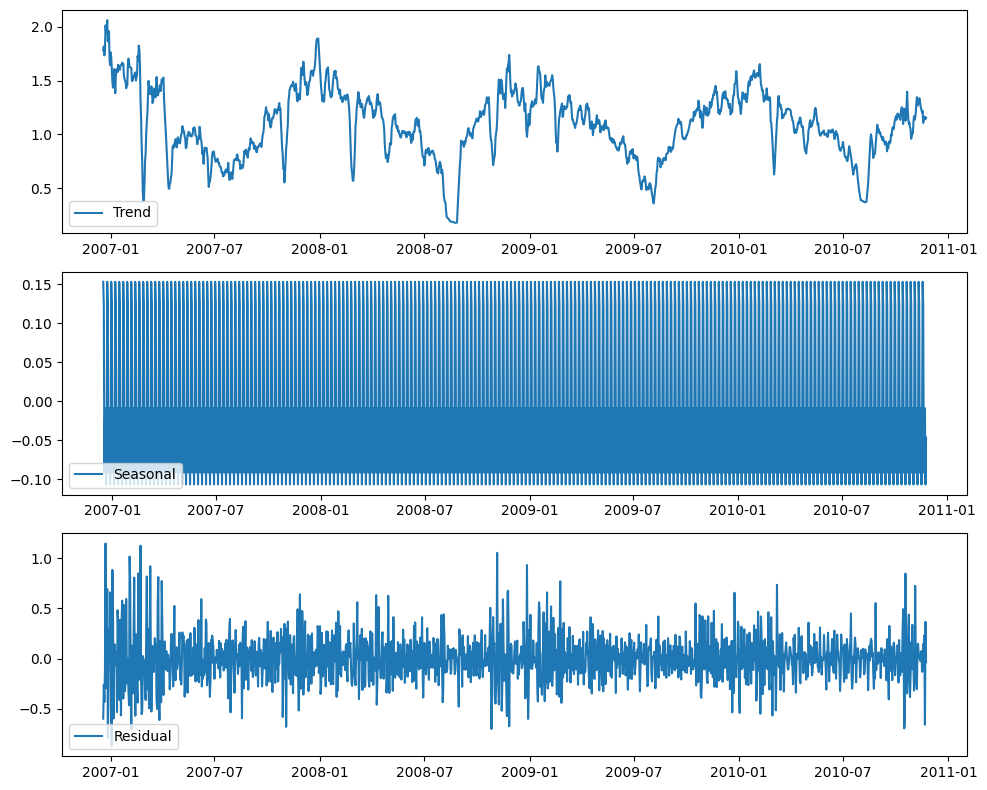

In [20]:
# Seasonal decomposition
daily_decomp = seasonal_decompose(df2, model='Additive')

# Plotting the components
plt.figure(figsize=(10, 8))
plt.subplot(3, 1, 1)
plt.plot(daily_decomp.trend, label='Trend')
plt.legend(loc='lower left')
plt.subplot(3, 1, 2)
plt.plot(daily_decomp.seasonal, label='Seasonal')
plt.legend(loc='lower left')
plt.subplot(3, 1, 3)
plt.plot(daily_decomp.resid, label='Residual')
plt.legend(loc='lower left')
plt.tight_layout()
plt.show()

## Stationarity check

In [ ]:
# Define a fuction to test the stationarity
def stationarity_test(df, resample_type):

  # Calculate rolling mean and standard deviation
  moving_Average = df.rolling(window=7).mean()
  moving_STD = df.rolling(window=7).std()

  # Plot the graph
  plt.figure(figsize=(20,5))
  sns.despine(left=True)
  orig = plt.plot(df, color='purple',label='Original')
  mean = plt.plot(moving_Average, color='yellow', label='Rolling Mean')
  std = plt.plot(moving_STD, color='cyan', label = 'Rolling Std')
  plt.legend(loc='best')
  plt.title('Rolling Mean & Standard Deviation of %s Resampled Data' %resample_type)
  plt.show()

  # Adfuller test
  print('\nResults of Augmented Dickey-Fuller test:')
  ADF_result = adfuller(df, autolag='AIC')
  output = pd.Series(ADF_result[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
  for key,value in ADF_result[4].items():
    output['Critical Value (%s)'%key] = value
  print(output)


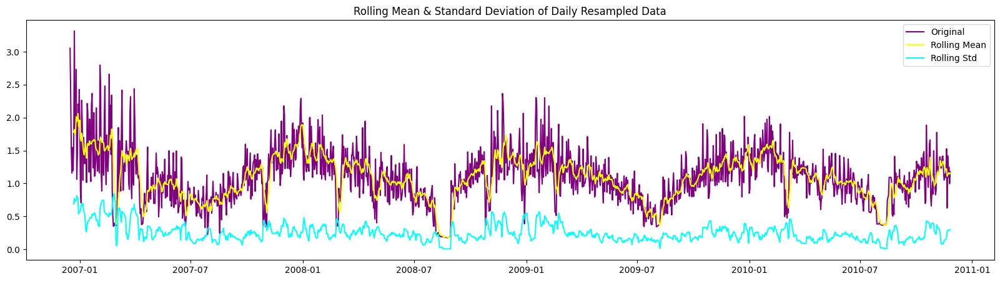


Results of Augmented Dickey-Fuller test:
Test Statistic                   -3.708240
p-value                           0.003999
#Lags Used                       22.000000
Number of Observations Used    1419.000000
Critical Value (1%)              -3.434967
Critical Value (5%)              -2.863579
Critical Value (10%)             -2.567856
dtype: float64


In [ ]:
stationarity_test(df2, 'Daily')

Observation:-
+ time series is not stationary.

## Train & Test Split

In [22]:
# Split the data into Train & Test Split
train_size = int(len(df2) * 0.80)
train_df2 = df2[:train_size]
test_df2 = df2[train_size:]

# Check the shape of Train & Test Split
train_df2.shape, test_df2.shape

((1153, 1), (289, 1))

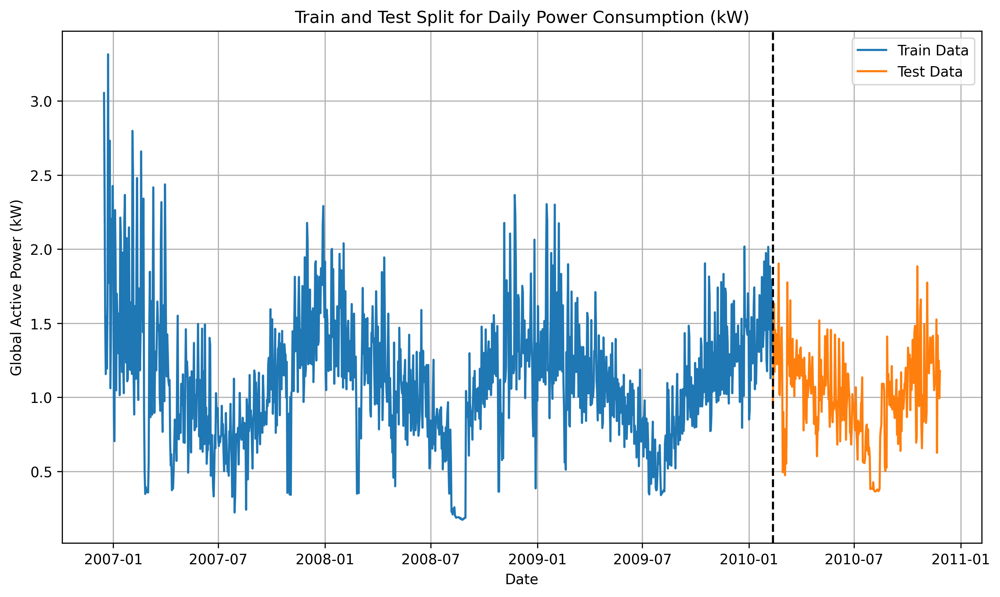

In [23]:
# Plot train & test monthly data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(train_df2.Global_active_power  , label='Train Data')
plt.plot(test_df2.Global_active_power, label='Test Data')
plt.axvline(test_df2.index[0], color='black', linestyle='--')
plt.title('Train and Test Split for Daily Power Consumption (kW)')
plt.xlabel('Date')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()

## ACF and PACF plot

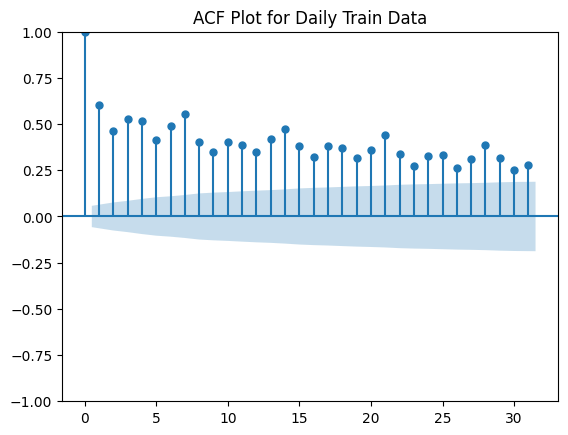

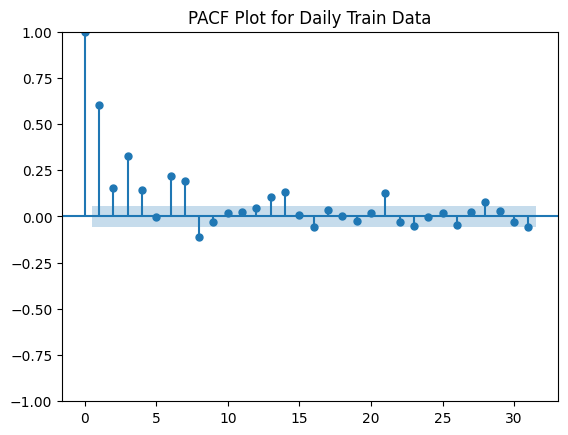

In [ ]:
# Plot ACF and PACF graphs
plot_acf(train_df2, title='ACF Plot for Daily Train Data')
plot_pacf(train_df2, title='PACF Plot for Daily Train Data')
plt.show()

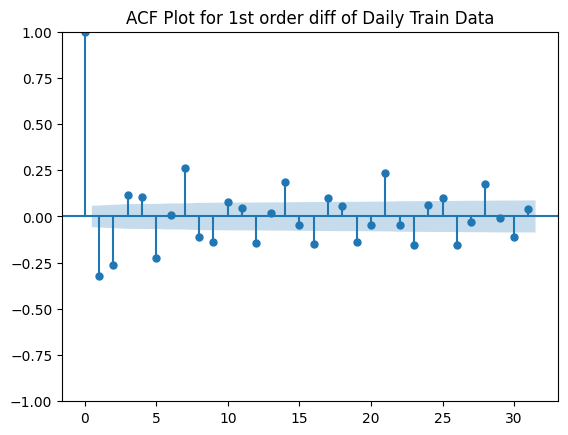

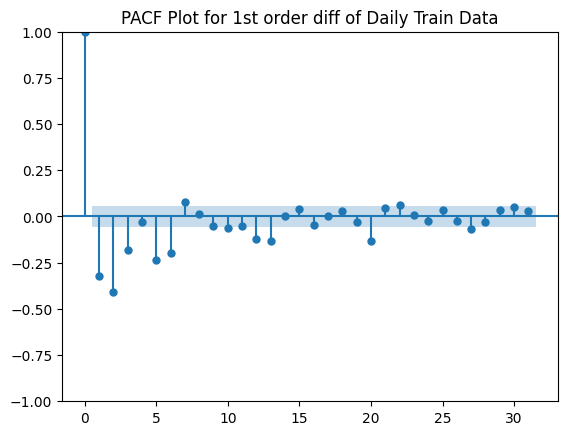

In [ ]:
# Plot ACF and PACF graphs for 1st order diff
plot_acf(train_df2.diff().dropna(), title='ACF Plot for 1st order diff of Daily Train Data')
plot_pacf(train_df2.diff().dropna(), title='PACF Plot for 1st order diff of Daily Train Data')
plt.show()

Observation: Strong correlation every 7 lag

## ARIMA

### Auto ARIMA model

In [ ]:
# Auto_ARIMA model
Auto_ARIMA_model = pm.auto_arima(df2['Global_active_power'], suppress_warnings=True, trace=True)

# Summary of Auto ARIMA model
Auto_ARIMA_model.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=660.533, Time=4.00 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1201.550, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1039.124, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=723.335, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1199.568, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=660.517, Time=0.83 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=664.275, Time=0.75 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=678.561, Time=0.57 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=661.749, Time=1.66 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=659.864, Time=0.84 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=661.135, Time=1.05 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=661.807, Time=1.71 sec
 ARIMA(0,1,3)(0,0,0)[0]             : AIC=658.032, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=662.470, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=65

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1442
Model:               SARIMAX(0, 1, 3)   Log Likelihood                -325.016
Date:                Sat, 24 Aug 2024   AIC                            658.032
Time:                        14:41:45   BIC                            679.125
Sample:                    12-16-2006   HQIC                           665.906
                         - 11-26-2010                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6218      0.020    -31.154      0.000      -0.661      -0.583
ma.L2         -0.2644      0.024    -10.883      0.000      -0.312      -0.217
ma.L3          0.0629      0.020      3.112      0.002       0.023       0.103
sigma2         0.0919      0.003     35.310      0.000       0.087       0.097
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               230.39
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               0.44   Skew:                             0.42
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Grid search for finding optimal value of ARIMA para p,d,q wrt lowest AIC

In [ ]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 8)
d_values = range(0, 2)
q_values = range(0, 6)

best_aic = np.inf
best_order = None

# Iterate over all combinations of p, d, q to perform grid search
pdq = list(itertools.product(p_values,d_values,q_values))

for param_values in pdq:
    try:
        ARIMA_model = ARIMA(train_df2,order=param_values)
        ARIMA_model_fit = ARIMA_model.fit()
        print(f'ARIMA{param_values} - AIC:{ARIMA_model_fit.aic}')

        if ARIMA_model_fit.aic < best_aic:
            best_aic = ARIMA_model_fit.aic
            best_order = param_values
    except:
        continue

print(f'\nBest ARIMA{best_order} - AIC:{best_aic}')

ARIMA(0, 0, 0) - AIC:1374.1691414122922
ARIMA(0, 0, 1) - AIC:997.192768242258
ARIMA(0, 0, 2) - AIC:944.383032023967
ARIMA(0, 0, 3) - AIC:880.5682669262826
ARIMA(0, 0, 4) - AIC:797.3817165520323
ARIMA(0, 0, 5) - AIC:797.3906521680956
ARIMA(0, 1, 0) - AIC:1080.633677038257
ARIMA(0, 1, 1) - AIC:693.7433819096057
ARIMA(0, 1, 2) - AIC:643.2019872660234
ARIMA(0, 1, 3) - AIC:637.3300240309978
ARIMA(0, 1, 4) - AIC:638.53588825666
ARIMA(0, 1, 5) - AIC:625.6489032700006
ARIMA(1, 0, 0) - AIC:843.6775575279495
ARIMA(1, 0, 1) - AIC:687.7808004780609
ARIMA(1, 0, 2) - AIC:642.994894870315
ARIMA(1, 0, 3) - AIC:635.1072053580916
ARIMA(1, 0, 4) - AIC:636.951602318142
ARIMA(1, 0, 5) - AIC:625.7157421079376
ARIMA(1, 1, 0) - AIC:957.3897414510811
ARIMA(1, 1, 1) - AIC:657.733989595616
ARIMA(1, 1, 2) - AIC:638.3549634854028
ARIMA(1, 1, 3) - AIC:639.200331679988
ARIMA(1, 1, 4) - AIC:639.2483383159623
ARIMA(1, 1, 5) - AIC:626.196813331409
ARIMA(2, 0, 0) - AIC:817.0370464517558
ARIMA(2, 0, 1) - AIC:657.52870851

### ARIMA model with best pdq value order= (3,1,3)

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


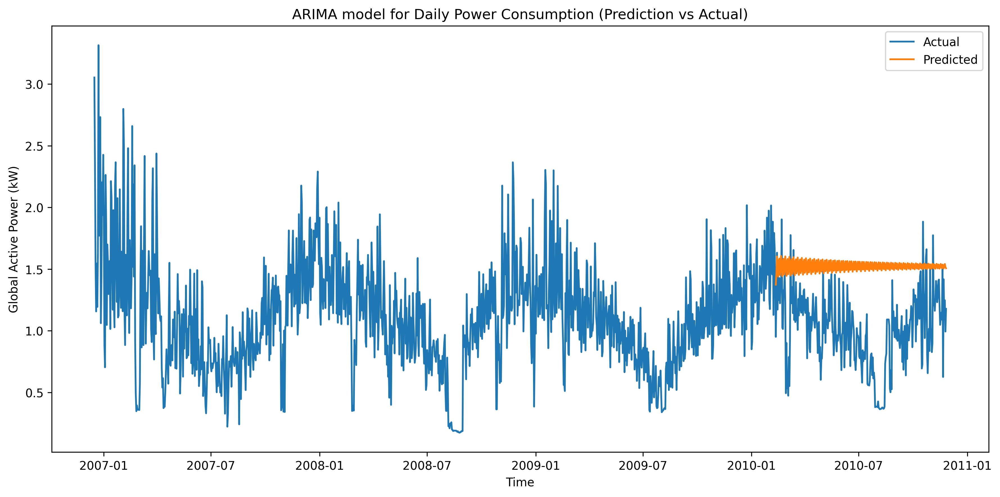


Train MAE: 0.226
Train MAPE: 0.242
Train MSE: 0.100
Train RMSE: 0.317

Test MAE: 0.526
Test MAPE: 0.709
Test MSE: 0.354
Test RMSE: 0.595


In [ ]:
# ARIMA model
ARIMA_model = ARIMA(train_df2, order= (3,1,3))
ARIMA_model_fit = ARIMA_model.fit()
pred_train = ARIMA_model_fit.predict(start=train_df2.index[0], end=train_df2.index[-1])
pred_test = ARIMA_model_fit.predict(start=test_df2.index[0], end=test_df2.index[-1])

# Plot the results for ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df2.Global_active_power, label='Actual')
plt.plot(pred_test, label='Predicted')
plt.title('ARIMA model for Daily Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(train_df2.Global_active_power, pred_train):.3f}')
print(f'Train MAPE: {mean_absolute_percentage_error(train_df2.Global_active_power, pred_train):.3f}')
print(f'Train MSE: {mean_squared_error(train_df2.Global_active_power, pred_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(train_df2.Global_active_power, pred_train)):.3f}')

print(f'\nTest MAE: {mean_absolute_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df2.Global_active_power, pred_test)):.3f}')

### Grid search for finding optimal value of ARIMA para p,d,q wrt lowest test RMSE

In [ ]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 8)
d_values = range(0, 2)
q_values = range(0, 6)

best_RMSE = np.inf
best_order = None

# Iterate over all combinations
pdq = list(itertools.product(p_values, d_values, q_values))

# Perform grid search over all combinations of p, d, q
for combinations in pdq:
    try:
        # Initialize and fit the ARIMA model
        ARIMA_model = ARIMA(train_df2, order=combinations)
        ARIMA_model_fit = ARIMA_model.fit()
        pred_test = ARIMA_model_fit.predict(start=test_df2.index[0], end=test_df2.index[-1])

        # Test RMSE
        test_rmse = np.sqrt(mean_squared_error(test_df2, pred_test))
        print(f'ARIMA{combinations} - RMSE: {test_rmse}')

        # Update the best RMSE and order
        if test_rmse < best_RMSE:
            best_RMSE = test_rmse
            best_order = combinations

    except:
        continue

# Print best model
print(f'\nBest ARIMA{best_order} - RMSE: {best_RMSE}')

ARIMA(0, 0, 0) - RMSE: 0.31816512316314516
ARIMA(0, 0, 1) - RMSE: 0.31858187491503465
ARIMA(0, 0, 2) - RMSE: 0.31855743016554655
ARIMA(0, 0, 3) - RMSE: 0.31949248484387927
ARIMA(0, 0, 4) - RMSE: 0.31910186580636213
ARIMA(0, 0, 5) - RMSE: 0.3189501835687811
ARIMA(0, 1, 0) - RMSE: 0.45581817509458494
ARIMA(0, 1, 1) - RMSE: 0.619523847973983
ARIMA(0, 1, 2) - RMSE: 0.6093903583871794
ARIMA(0, 1, 3) - RMSE: 0.6174710526588603
ARIMA(0, 1, 4) - RMSE: 0.6169974782809065
ARIMA(0, 1, 5) - RMSE: 0.6036037170737718
ARIMA(1, 0, 0) - RMSE: 0.318951045095949
ARIMA(1, 0, 1) - RMSE: 0.3482170272618885
ARIMA(1, 0, 2) - RMSE: 0.4007733418923836
ARIMA(1, 0, 3) - RMSE: 0.3706007399954216
ARIMA(1, 0, 4) - RMSE: 0.37584084978419746
ARIMA(1, 0, 5) - RMSE: 0.40142503049261774
ARIMA(1, 1, 0) - RMSE: 0.5190181337545656
ARIMA(1, 1, 1) - RMSE: 0.6087370746688645
ARIMA(1, 1, 2) - RMSE: 0.6157581065190911
ARIMA(1, 1, 3) - RMSE: 0.6175231627648999
ARIMA(1, 1, 4) - RMSE: 0.61582973897878
ARIMA(1, 1, 5) - RMSE: 0.60483

### ARIMA model with best pdq value order= (3,0,3)

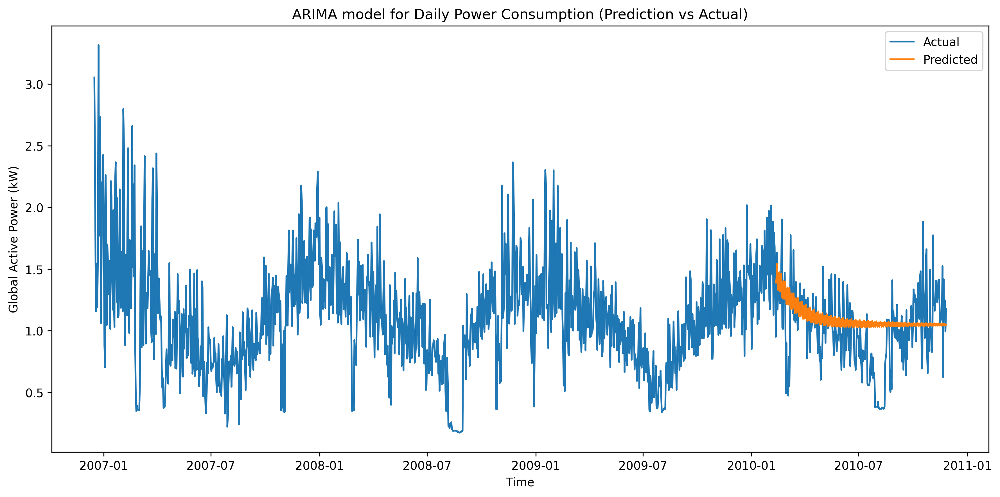


Train MAE: 0.224
Train MAPE: 0.239
Train MSE: 0.098
Train RMSE: 0.312

Test MAE: 0.228
Test MAPE: 0.320
Test MSE: 0.092
Test RMSE: 0.303


In [28]:
# ARIMA model
ARIMA_model = ARIMA(train_df2, order= (3,0,3))
ARIMA_model_fit = ARIMA_model.fit()
pred_train = ARIMA_model_fit.predict(start=train_df2.index[0], end=train_df2.index[-1])
pred_test = ARIMA_model_fit.predict(start=test_df2.index[0], end=test_df2.index[-1])

# Plot the results for ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df2.Global_active_power, label='Actual')
plt.plot(pred_test, label='Predicted')
plt.title('ARIMA model for Daily Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(train_df2.Global_active_power, pred_train):.3f}')
print(f'Train MAPE: {mean_absolute_percentage_error(train_df2.Global_active_power, pred_train):.3f}')
print(f'Train MSE: {mean_squared_error(train_df2.Global_active_power, pred_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(train_df2.Global_active_power, pred_train)):.3f}')

print(f'\nTest MAE: {mean_absolute_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df2.Global_active_power, pred_test)):.3f}')

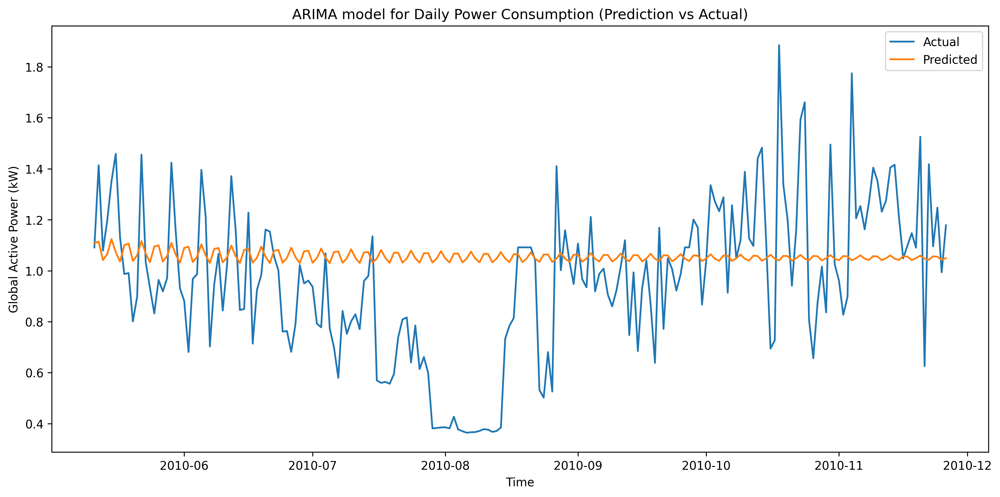

In [29]:
# Plot the results for ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(test_df2[-200:], label='Actual')
plt.plot(pred_test[-200:], label='Predicted')
plt.title('ARIMA model for Daily Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

## Seasonal ARIMA

### Auto_SARIMA model

In [ ]:
# Auto_SARIMA model
Auto_SARIMA_model = pm.auto_arima(train_df2, seasonal=True, m=7, stepwise=True, suppress_warnings=True)

print(Auto_SARIMA_model.summary())

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                 1153
Model:             SARIMAX(3, 0, 1)x(1, 0, 1, 7)   Log Likelihood                -230.159
Date:                           Tue, 27 Aug 2024   AIC                            476.317
Time:                                   01:14:31   BIC                            516.718
Sample:                               12-16-2006   HQIC                           491.566
                                    - 02-10-2010                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0022      0.001      1.880      0.060    -9.3e-05       0.004
ar.L1          0.9399      0.061     15.354

### Seasonal ARIMA model with best pdq value order=(3,0,1), seasonal_order=(1,0,1,7)

In [35]:
# Seasonal ARIMA model
Seasonal_ARIMA_model = SARIMAX(train_df2, order=(3,0,1), seasonal_order=(1,0,1,7))
Seasonal_ARIMA_model_fit = Seasonal_ARIMA_model.fit()
pred_test = Seasonal_ARIMA_model_fit.predict(start=test_df2.index[0], end=test_df2.index[-1])

# Calculate evaluation metrics for Seasonal ARIMA model
print(f'\nTest MAE: {mean_absolute_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df2.Global_active_power, pred_test)):.3f}')


Test MAE: 0.260
Test MAPE: 0.360
Test MSE: 0.114
Test RMSE: 0.338


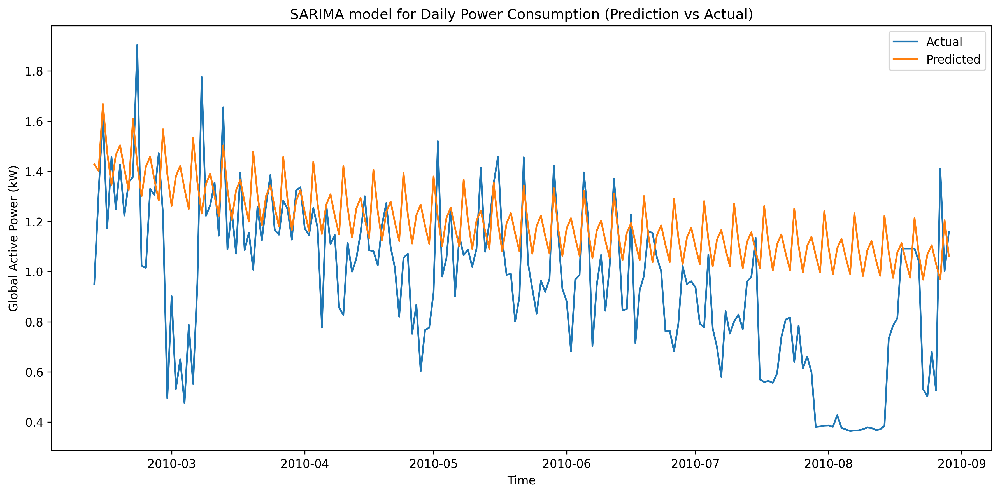

In [36]:
# Plot the results for ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(test_df2[:200], label='Actual')
plt.plot(pred_test[:200], label='Predicted')
plt.title('SARIMA model for Daily Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

### Grid search for finding optimal value of SARIMA para P, D, Q, m wrt lowest test RMSE

In [ ]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 4)
d_values = range(0, 2)
q_values = range(0, 4)

# Define the P, D, Q, m ranges for the seasonal part
P_values = range(0, 3)
D_values = range(0, 2)
Q_values = range(0, 3)

m = [7]

# Variables to store the best RMSE and orders
best_rmse = np.inf
best_nonseasonal_order = None
best_seasonal_order = None

# Combinations of (p, d, q) for non-seasonal part
pdq = list(itertools.product(p_values, d_values, q_values))

# Combinations of (P, D, Q, m) for seasonal part
seasonal_pdq = list(itertools.product(P_values, D_values, Q_values, m))

# Gride Search
for combinations in pdq:
    for seasonal_combinations in seasonal_pdq:
        try:
            SARIMA_model = SARIMAX(train_df2, order=combinations, seasonal_order=seasonal_combinations)
            SARIMA_model_fit = SARIMA_model.fit()
            test_pred = SARIMA_model_fit.forecast(steps=len(test_df2))
            rmse = np.sqrt(mean_squared_error(test_df2, test_pred))
            print(f'SARIMA{combinations}x{seasonal_combinations} - RMSE: {rmse}')

            # best RMSE and orders
            if rmse < best_rmse:
                best_rmse = rmse
                best_nonseasonal_order = combinations
                best_seasonal_order = seasonal_combinations
        except:
            continue

# Print best model
print(f'\nBest SARIMA{best_nonseasonal_order}x{best_seasonal_order} - RMSE: {best_rmse}')

SARIMA(0, 0, 0)x(0, 0, 0, 7) - RMSE: 1.0517220780393948
SARIMA(0, 0, 0)x(0, 0, 1, 7) - RMSE: 1.0362641459814326
SARIMA(0, 0, 0)x(0, 0, 2, 7) - RMSE: 1.026107488980839
SARIMA(0, 0, 0)x(0, 1, 0, 7) - RMSE: 0.672885512879485
SARIMA(0, 0, 0)x(0, 1, 1, 7) - RMSE: 0.5931557090180339
SARIMA(0, 0, 0)x(0, 1, 2, 7) - RMSE: 0.5853911469285356
SARIMA(0, 0, 0)x(1, 0, 0, 7) - RMSE: 0.5975251487189769
SARIMA(0, 0, 0)x(1, 0, 1, 7) - RMSE: 0.5033375257646479
SARIMA(0, 0, 0)x(1, 0, 2, 7) - RMSE: 0.5015408891285825
SARIMA(0, 0, 0)x(1, 1, 0, 7) - RMSE: 0.6550414109247051
SARIMA(0, 0, 0)x(1, 1, 1, 7) - RMSE: 0.585342772510152
SARIMA(0, 0, 0)x(1, 1, 2, 7) - RMSE: 0.5871046636969821
SARIMA(0, 0, 0)x(2, 0, 0, 7) - RMSE: 0.3877042577358874
SARIMA(0, 0, 0)x(2, 0, 1, 7) - RMSE: 0.5014686274647631
SARIMA(0, 0, 0)x(2, 0, 2, 7) - RMSE: 0.5022315963649316
SARIMA(0, 0, 0)x(2, 1, 0, 7) - RMSE: 0.6461750582604177
SARIMA(0, 0, 0)x(2, 1, 1, 7) - RMSE: 0.5882474148737605
SARIMA(0, 0, 0)x(2, 1, 2, 7) - RMSE: 0.588129607738

### Seasonal ARIMA model with best pdq value order=(0,1,0), seasonal_order=(2,0,0,7)

In [34]:
# Seasonal ARIMA model
Seasonal_ARIMA_model = SARIMAX(train_df2, order=(0,1,0), seasonal_order=(2,0,0,7))
Seasonal_ARIMA_model_fit = Seasonal_ARIMA_model.fit()
pred_test = Seasonal_ARIMA_model_fit.predict(start=test_df2.index[0], end=test_df2.index[-1])

# Calculate evaluation metrics for Seasonal ARIMA model
print(f'\nTest MAE: {mean_absolute_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df2.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df2.Global_active_power, pred_test)):.3f}')


Test MAE: 0.231
Test MAPE: 0.295
Test MSE: 0.087
Test RMSE: 0.294


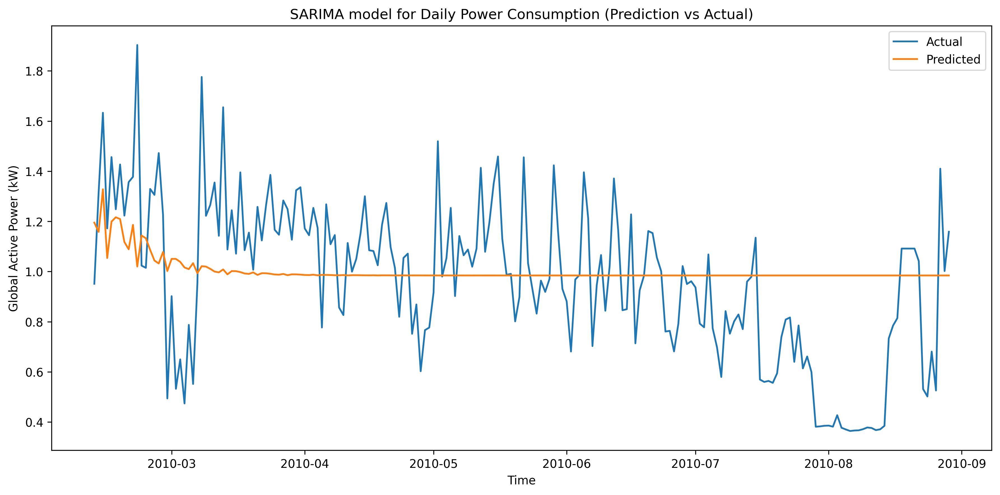

In [33]:
# Plot the results for ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(test_df2[:200], label='Actual')
plt.plot(pred_test[:200], label='Predicted')
plt.title('SARIMA model for Daily Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

# Monthly Power Comsumption Forecasting

In [ ]:
# Resampled the data
monthly_resampled = df_imputed.resample('M').mean()

# Make new data frame with univariate feature (Global_active_power)
df3 = monthly_resampled[['Global_active_power']]
df3

,Global_active_power
date_time,
2006-12-31,1.901148
2007-01-31,1.546014
2007-02-28,1.401068
2007-03-31,1.318622
2007-04-30,0.908462
2007-05-31,0.985862
2007-06-30,0.827078
2007-07-31,0.668612
2007-08-31,0.764348


## EDA

In [ ]:
# Plot the visualization, distribution and correlation of Hourly resampled data
df_visu_dist_corr(df_imputed, "M", "Monthly")

## Decompose the data

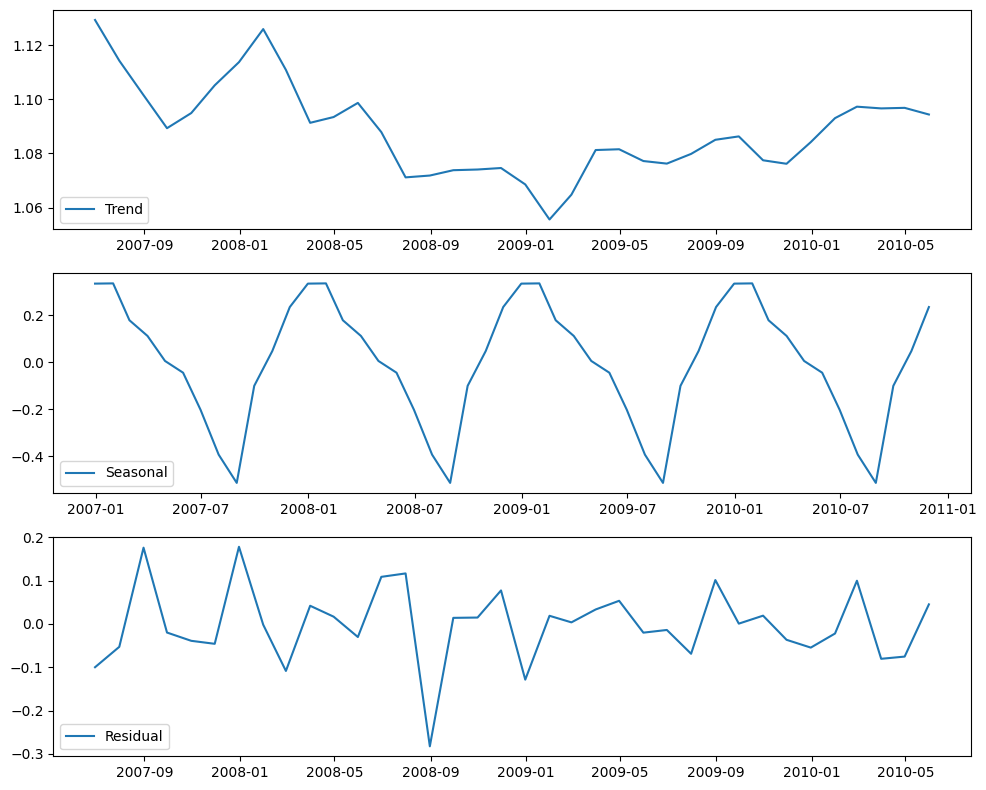

In [ ]:
# Seasonal decomposition
monthly_decomp = seasonal_decompose(df3, model='Additive')

# Plotting the components
plt.figure(figsize=(10, 8))
plt.subplot(3, 1, 1)
plt.plot(monthly_decomp.trend, label='Trend')
plt.legend(loc='lower left')
plt.subplot(3, 1, 2)
plt.plot(monthly_decomp.seasonal, label='Seasonal')
plt.legend(loc='lower left')
plt.subplot(3, 1, 3)
plt.plot(monthly_decomp.resid, label='Residual')
plt.legend(loc='lower left')
plt.tight_layout()
plt.show()

## Stationarity check

In [ ]:
# Define a fuction to test the stationarity
def stationarity_test(df, resample_type):

  # Calculate rolling mean and standard deviation
  moving_Average = df.rolling(window=12).mean()
  moving_STD = df.rolling(window=12).std()

  # Plot the graph
  plt.figure(figsize=(20,5))
  sns.despine(left=True)
  orig = plt.plot(df, color='purple',label='Original')
  mean = plt.plot(moving_Average, color='yellow', label='Rolling Mean')
  std = plt.plot(moving_STD, color='cyan', label = 'Rolling Std')
  plt.legend(loc='best')
  plt.title('Rolling Mean & Standard Deviation of %s Resampled Data' %resample_type)
  plt.show()

  # Adfuller test
  print('\nResults of Augmented Dickey-Fuller test:')
  ADF_result = adfuller(df, autolag='AIC')
  output = pd.Series(ADF_result[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
  for key,value in ADF_result[4].items():
    output['Critical Value (%s)'%key] = value
  print(output)


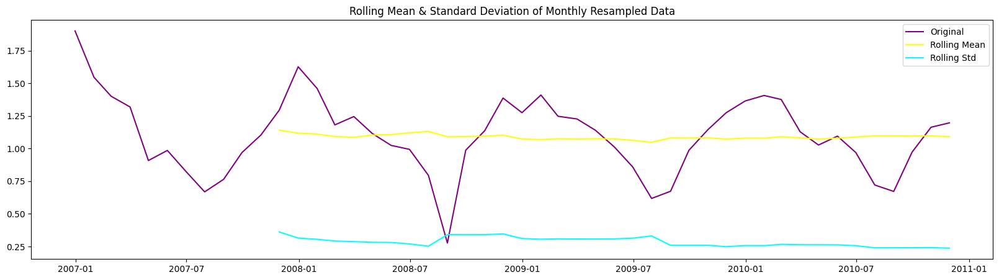


Results of Augmented Dickey-Fuller test:
Test Statistic                 -4.949639
p-value                         0.000028
#Lags Used                      9.000000
Number of Observations Used    38.000000
Critical Value (1%)            -3.615509
Critical Value (5%)            -2.941262
Critical Value (10%)           -2.609200
dtype: float64


In [ ]:
stationarity_test(df3, 'Monthly')

Observation:-
+ time series is stationary.

## Train & Test Split

In [ ]:
# Split the data into Train & Test Split
train_size = int(len(df3) * 0.80)
train_df3 = df3[:train_size]
test_df3 = df3[train_size:]

# Check the shape of Train & Test Split
train_df3.shape, test_df3.shape

((38, 1), (10, 1))

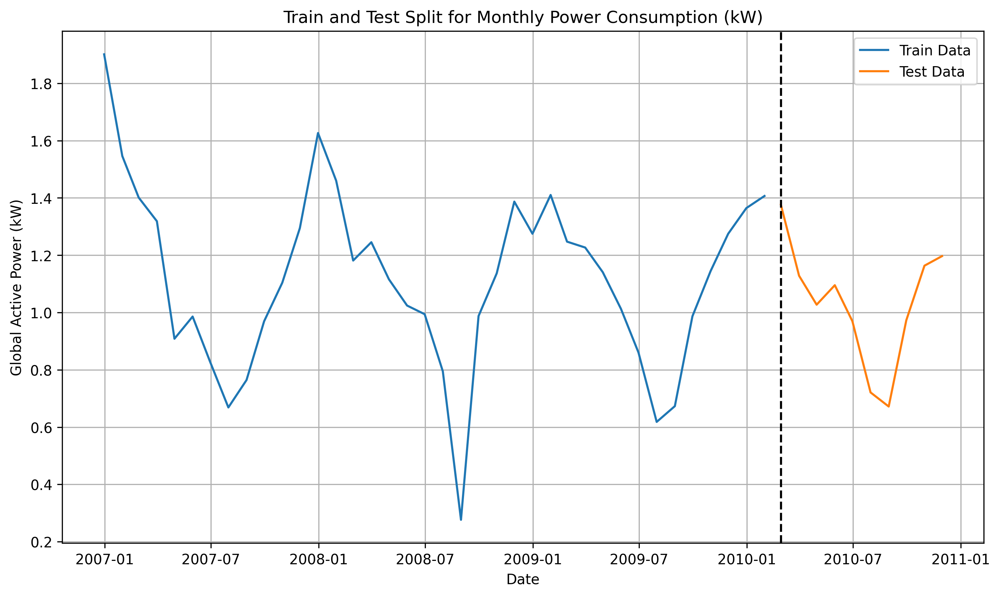

In [ ]:
# Plot train & test monthly data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(train_df3.Global_active_power  , label='Train Data')
plt.plot(test_df3.Global_active_power, label='Test Data')
plt.axvline(test_df3.index[0], color='black', linestyle='--')
plt.title('Train and Test Split for Monthly Power Consumption (kW)')
plt.xlabel('Date')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()

## ACF and PACF plot

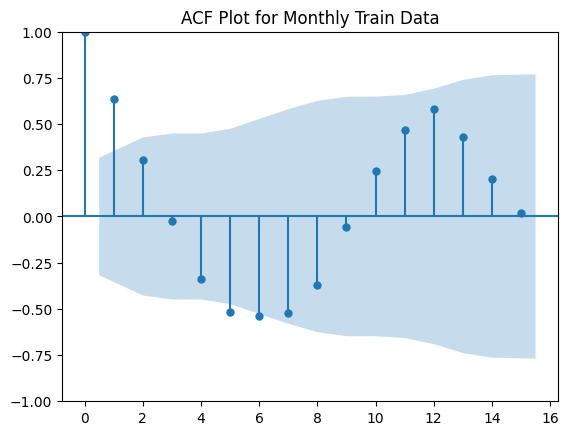

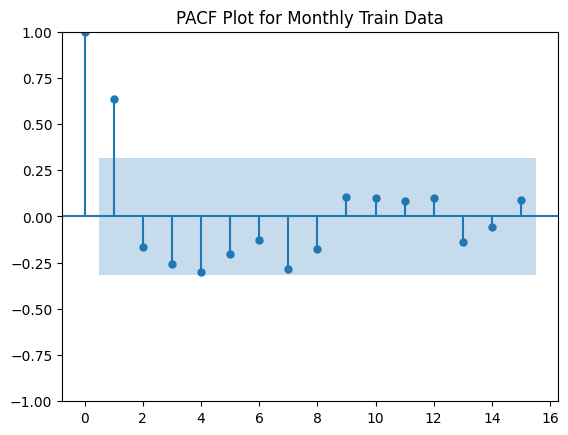

In [ ]:
# Plot ACF and PACF graphs
plot_acf(train_df3, title='ACF Plot for Monthly Train Data',lags=15)
plot_pacf(train_df3, title='PACF Plot for Monthly Train Data',lags=15)
plt.show()

## ARIMA

### Auto ARIMA model

In [ ]:
# Auto_ARIMA model
Auto_ARIMA_model = pm.auto_arima(df3['Global_active_power'], suppress_warnings=True, trace=True)

# Summary of Auto ARIMA model
Auto_ARIMA_model.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=-27.269, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=21.975, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-8.521, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-0.021, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=150.772, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=-7.805, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-23.587, Time=0.22 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=-28.905, Time=0.28 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=-6.435, Time=0.11 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=-29.516, Time=0.35 sec
 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=-16.674, Time=0.44 sec
 ARIMA(3,0,4)(0,0,0)[0] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,4)(0,0,0)[0] intercept   : AIC=-17.353, Time=0.31 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=-19.596, Time=0.33

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   48
Model:               SARIMAX(3, 0, 3)   Log Likelihood                  22.758
Date:                Mon, 26 Aug 2024   AIC                            -29.516
Time:                        18:17:58   BIC                            -14.546
Sample:                    12-31-2006   HQIC                           -23.859
                         - 11-30-2010                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.5828      0.044     13.161      0.000       0.496       0.670
ar.L1          0.7281      0.139      5.253      0.000       0.456       1.000
ar.L2          0.7160      0.237      3.018      0.003       0.251       1.181
ar.L3         -0.9768      0.131     -7.433      0.000      -1.234      -0.719
ma.L1         -0.8965      0.938     -0.955      0.339      -2.736       0.943
ma.L2         -0.7909      0.521     -1.518      0.129      -1.812       0.230
ma.L3          0.9290      1.054      0.881      0.378      -1.137       2.995
sigma2         0.0188      0.018      1.042      0.298      -0.017       0.054
===================================================================================
Ljung-Box (L1) (Q):                   0.84   Jarque-Bera (JB):                16.37
Prob(Q):                              0.36   Prob(JB):                         0.00
Heteroskedasticity (H):               0.28   Skew:                            -0.45
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Grid search for finding optimal value of ARIMA para p,d,q wrt lowest AIC

In [ ]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 9)
d_values = range(0, 1)
q_values = range(0, 4)

best_aic = np.inf
best_order = None

# Iterate over all combinations
pdq = list(itertools.product(p_values,d_values,q_values))

for combinations in pdq:
    try:
        ARIMA_model = ARIMA(train_df3,order=combinations)
        ARIMA_model_fit = ARIMA_model.fit()
        print(f'ARIMA{combinations} - AIC:{ARIMA_model_fit.aic}')

        if ARIMA_model_fit.aic < best_aic:
            best_aic = ARIMA_model_fit.aic
            best_order = combinations
    except:
        continue

print(f'\nBest ARIMA{best_order} - AIC:{best_aic}')

ARIMA(0, 0, 0) - AIC:22.45770048037025
ARIMA(0, 0, 1) - AIC:6.659056870507943
ARIMA(0, 0, 2) - AIC:1.5433499103289776
ARIMA(0, 0, 3) - AIC:0.5587367423621803
ARIMA(1, 0, 0) - AIC:-1.2321242126420708
ARIMA(1, 0, 1) - AIC:-0.37605708980394326
ARIMA(1, 0, 2) - AIC:0.7389628891713045
ARIMA(1, 0, 3) - AIC:1.1615190979253818
ARIMA(2, 0, 0) - AIC:-1.1806023358872437
ARIMA(2, 0, 1) - AIC:-10.962236622367293
ARIMA(2, 0, 2) - AIC:-19.23921047379123
ARIMA(2, 0, 3) - AIC:-17.688172706090665
ARIMA(3, 0, 0) - AIC:-2.1728380043595905
ARIMA(3, 0, 1) - AIC:-11.344009466747682
ARIMA(3, 0, 2) - AIC:-7.85881138700158
ARIMA(3, 0, 3) - AIC:-15.314255692584005
ARIMA(4, 0, 0) - AIC:-3.7387090541279715
ARIMA(4, 0, 1) - AIC:-10.834570356103566
ARIMA(4, 0, 2) - AIC:-7.348214429817638
ARIMA(4, 0, 3) - AIC:-4.874075803513737
ARIMA(5, 0, 0) - AIC:-5.202295001958813
ARIMA(5, 0, 1) - AIC:-9.452470357519658
ARIMA(5, 0, 2) - AIC:-7.357897722814457
ARIMA(5, 0, 3) - AIC:-6.18157898834907
ARIMA(6, 0, 0) - AIC:-3.726467406

### ARIMA model with best pdq value order= (2,0,2)

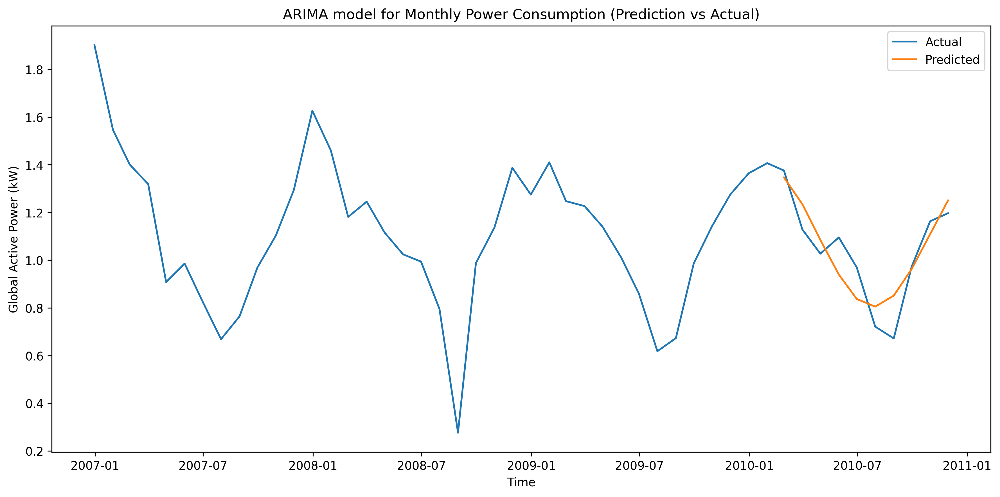


Train MAE: 0.125
Train MAPE: 0.145
Train MSE: 0.038
Train RMSE: 0.196

Test MAE: 0.086
Test MAPE: 0.094
Test MSE: 0.010
Test RMSE: 0.101


In [ ]:
# ARIMA model
ARIMA_model = ARIMA(train_df3, order= (2,0,2))
ARIMA_model_fit = ARIMA_model.fit()
pred_train = ARIMA_model_fit.predict(start=train_df3.index[0], end=train_df3.index[-1])
pred_test = ARIMA_model_fit.predict(start=test_df3.index[0], end=test_df3.index[-1])

# Plot the results for ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df3.Global_active_power, label='Actual')
plt.plot(pred_test, label='Predicted')
plt.title('ARIMA model for Monthly Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train MAPE: {mean_absolute_percentage_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train MSE: {mean_squared_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(train_df3.Global_active_power, pred_train)):.3f}')

print(f'\nTest MAE: {mean_absolute_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df3.Global_active_power, pred_test)):.3f}')

### Grid search for finding optimal value of ARIMA para p,d,q wrt lowest test RMSE

In [ ]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 9)
d_values = range(0, 1)
q_values = range(0, 4)

best_RMSE = np.inf
best_order = None

# Iterate over all combinations
pdq = list(itertools.product(p_values, d_values, q_values))

# Perform grid search over all combinations of p, d, q
for combinations in pdq:
    try:
        # Initialize and fit the ARIMA model
        ARIMA_model = ARIMA(train_df3, order=combinations)
        ARIMA_model_fit = ARIMA_model.fit()
        pred_test = ARIMA_model_fit.predict(start=test_df3.index[0], end=test_df3.index[-1])

        # Test RMSE
        test_rmse = np.sqrt(mean_squared_error(test_df3, pred_test))
        print(f'ARIMA{combinations} - RMSE: {test_rmse}')

        # Update the best RMSE and corresponding order if current model is better
        if test_rmse < best_RMSE:
            best_RMSE = test_rmse
            best_order = combinations

    except:
        continue

# Print best model
print(f'\nBest ARIMA{best_order} - RMSE: {best_RMSE}')

ARIMA(0, 0, 0) - RMSE: 0.22062933922507957
ARIMA(0, 0, 1) - RMSE: 0.21610227962316308
ARIMA(0, 0, 2) - RMSE: 0.22258288194184633
ARIMA(0, 0, 3) - RMSE: 0.23602906071708005
ARIMA(1, 0, 0) - RMSE: 0.2921379359559711
ARIMA(1, 0, 1) - RMSE: 0.2682327916133282
ARIMA(1, 0, 2) - RMSE: 0.2606330832631891
ARIMA(1, 0, 3) - RMSE: 0.25159260021316293
ARIMA(2, 0, 0) - RMSE: 0.24272802458772713
ARIMA(2, 0, 1) - RMSE: 0.11957864717478149
ARIMA(2, 0, 2) - RMSE: 0.10117816922446518
ARIMA(2, 0, 3) - RMSE: 0.10269475780281309
ARIMA(3, 0, 0) - RMSE: 0.19165769549214767
ARIMA(3, 0, 1) - RMSE: 0.1080054053548478
ARIMA(3, 0, 2) - RMSE: 0.11260566882286667
ARIMA(3, 0, 3) - RMSE: 0.10104869771829376
ARIMA(4, 0, 0) - RMSE: 0.14907386761375543
ARIMA(4, 0, 1) - RMSE: 0.10619465432728263
ARIMA(4, 0, 2) - RMSE: 0.1084518323621539
ARIMA(4, 0, 3) - RMSE: 0.12048595814370983
ARIMA(5, 0, 0) - RMSE: 0.12373485044663382
ARIMA(5, 0, 1) - RMSE: 0.10354622422551342
ARIMA(5, 0, 2) - RMSE: 0.10417014240832995
ARIMA(5, 0, 3) -

### ARIMA model with best pdq value order= (3,0,3)

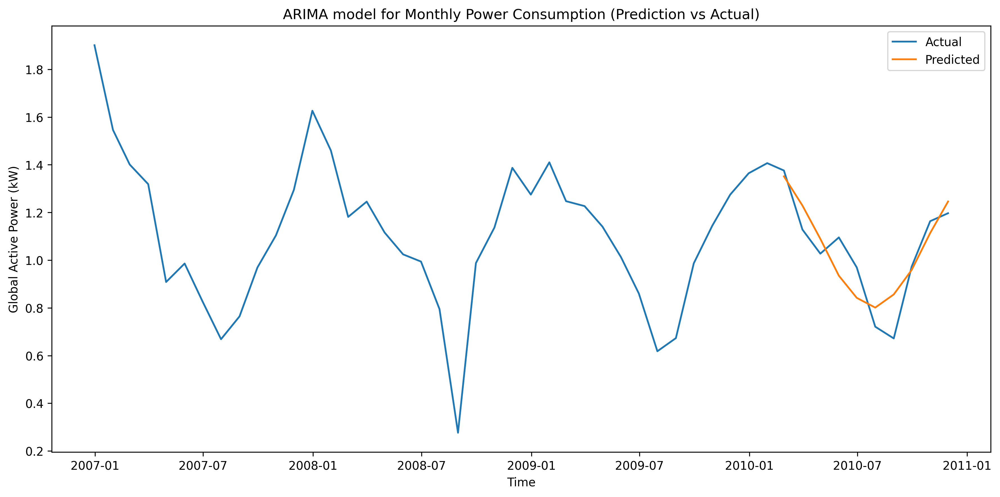


Train MAE: 0.125
Train MAPE: 0.145
Train MSE: 0.038
Train RMSE: 0.195

Test MAE: 0.085
Test MAPE: 0.093
Test MSE: 0.010
Test RMSE: 0.101


In [ ]:
# ARIMA model
ARIMA_model = ARIMA(train_df3, order= (3,0,3))
ARIMA_model_fit = ARIMA_model.fit()
pred_train = ARIMA_model_fit.predict(start=train_df3.index[0], end=train_df3.index[-1])
pred_test = ARIMA_model_fit.predict(start=test_df3.index[0], end=test_df3.index[-1])

# Plot the results for ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df3.Global_active_power, label='Actual')
plt.plot(pred_test, label='Predicted')
plt.title('ARIMA model for Monthly Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate evaluation metrics
print(f'\nTrain MAE: {mean_absolute_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train MAPE: {mean_absolute_percentage_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train MSE: {mean_squared_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(train_df3.Global_active_power, pred_train)):.3f}')

print(f'\nTest MAE: {mean_absolute_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df3.Global_active_power, pred_test)):.3f}')

## Seasonal ARIMA

### Grid search for finding optimal value of SARIMA para P, D, Q, m wrt lowest AIC

In [ ]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 9)
d_values = range(0, 1)
q_values = range(0, 4)

# Define the P, D, Q, m ranges for the seasonal part
P_values = range(0, 3)
D_values = range(0, 1)
Q_values = range(0, 3)

m = [12]  # Monthly seasonality

best_aic = np.inf
best_nonseasonal_order = None
best_seasonal_order = None

# Iterate over all combinations
pdq = list(itertools.product(p_values, d_values, q_values))
seasonal_pdq = list(itertools.product(P_values, D_values, Q_values, m))

for combinations in pdq:
    for seasonal_combinations in seasonal_pdq:
        try:
            SARIMA_model = SARIMAX(train_df3, order=combinations, seasonal_order=seasonal_combinations)
            SARIMA_model_fit = SARIMA_model.fit()
            print(f'SARIMA{combinations}x{seasonal_combinations} - AIC:{SARIMA_model_fit.aic}')

            if SARIMA_model_fit.aic < best_aic:
                best_aic = SARIMA_model_fit.aic
                best_nonseasonal_order = combinations
                best_seasonal_order = seasonal_combinations
        except:
            continue

print(f'\nBest SARIMA{best_nonseasonal_order}x{best_seasonal_order} - AIC:{best_aic}')

SARIMA(0, 0, 0)x(0, 0, 0, 12) - AIC:121.23147177155889
SARIMA(0, 0, 0)x(0, 0, 1, 12) - AIC:98.09003533704177
SARIMA(0, 0, 0)x(0, 0, 2, 12) - AIC:82.59126737168847
SARIMA(0, 0, 0)x(1, 0, 0, 12) - AIC:25.541626468240292
SARIMA(0, 0, 0)x(1, 0, 1, 12) - AIC:25.303423158768236
SARIMA(0, 0, 0)x(1, 0, 2, 12) - AIC:27.15835550821613
SARIMA(0, 0, 0)x(2, 0, 0, 12) - AIC:25.143149043424547
SARIMA(0, 0, 0)x(2, 0, 1, 12) - AIC:27.059927367891085
SARIMA(0, 0, 0)x(2, 0, 2, 12) - AIC:29.059927356141664
SARIMA(0, 0, 1)x(0, 0, 0, 12) - AIC:84.27005698327943
SARIMA(0, 0, 1)x(0, 0, 1, 12) - AIC:64.16169322602886
SARIMA(0, 0, 1)x(0, 0, 2, 12) - AIC:55.568102649013525
SARIMA(0, 0, 1)x(1, 0, 0, 12) - AIC:24.352528840963224
SARIMA(0, 0, 1)x(1, 0, 1, 12) - AIC:22.70971285319055
SARIMA(0, 0, 1)x(1, 0, 2, 12) - AIC:27.72932470299269
SARIMA(0, 0, 1)x(2, 0, 0, 12) - AIC:22.08498543431
SARIMA(0, 0, 1)x(2, 0, 1, 12) - AIC:23.739069651327874
SARIMA(0, 0, 2)x(0, 0, 0, 12) - AIC:54.335151689832486
SARIMA(0, 0, 2)x(0, 0

### Seasonal ARIMA model with best pdq value order=(8,0,2), seasonal_order=(0,0,0,12)

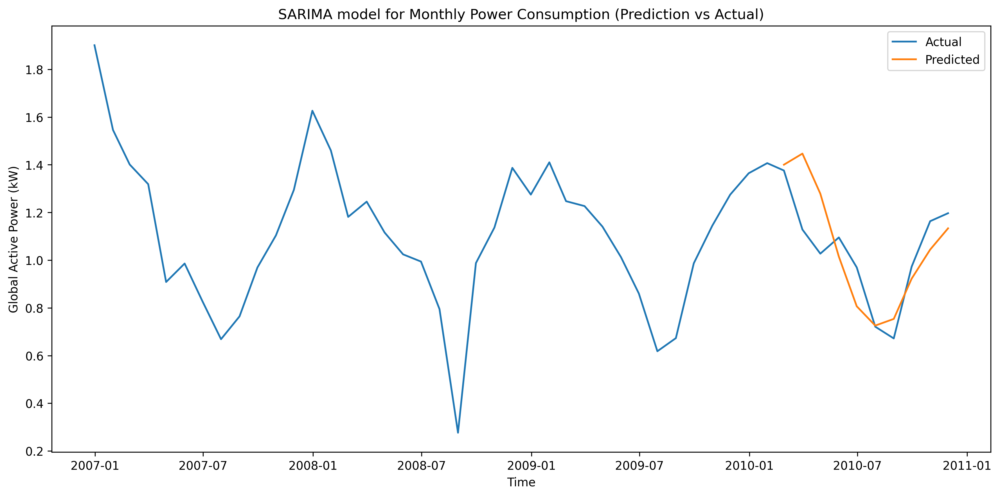


Train MAE: 0.172
Train MAPE: 0.170
Train MSE: 0.118
Train RMSE: 0.344

Test MAE: 0.116
Test MAPE: 0.112
Test MSE: 0.023
Test RMSE: 0.150


In [ ]:
# Seasonal ARIMA model
Seasonal_ARIMA_model = SARIMAX(train_df3, order=(8,0,2), seasonal_order=(0,0,0,12))
Seasonal_ARIMA_model_fit = Seasonal_ARIMA_model.fit()
pred_train = Seasonal_ARIMA_model_fit.predict(start=train_df3.index[0], end=train_df3.index[-1])
pred_test = Seasonal_ARIMA_model_fit.predict(start=test_df3.index[0], end=test_df3.index[-1])

#  Plot the results for Seasonal ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df3.Global_active_power, label='Actual')
plt.plot(pred_test, label='Predicted')
plt.title('SARIMA model for Monthly Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate evaluation metrics for Seasonal ARIMA model
print(f'\nTrain MAE: {mean_absolute_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train MAPE: {mean_absolute_percentage_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train MSE: {mean_squared_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(train_df3.Global_active_power, pred_train)):.3f}')

print(f'\nTest MAE: {mean_absolute_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df3.Global_active_power, pred_test)):.3f}')

### Grid search for finding optimal value of SARIMA para P, D, Q, m wrt lowest test RMSE

In [ ]:
# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Define the p, d, q ranges
p_values = range(0, 9)
d_values = range(0, 1)
q_values = range(0, 4)

# Define the P, D, Q, m ranges for the seasonal part
P_values = range(0, 3)
D_values = range(0, 1)
Q_values = range(0, 3)
m = [12]  # Seasonality period

# Variables to store the best RMSE and orders
best_rmse = np.inf
best_nonseasonal_order = None
best_seasonal_order = None

# Combinations of (p, d, q) for non-seasonal part
pdq = list(itertools.product(p_values, d_values, q_values))

# Combinations of (P, D, Q, m) for seasonal part
seasonal_pdq = list(itertools.product(P_values, D_values, Q_values, m))

# Gride Search
for combinations in pdq:
    for seasonal_combinations in seasonal_pdq:
        try:
            SARIMA_model = SARIMAX(train_df3, order=combinations, seasonal_order=seasonal_combinations)
            SARIMA_model_fit = SARIMA_model.fit(disp=False)
            test_pred = SARIMA_model_fit.forecast(steps=len(test_df3))
            rmse = np.sqrt(mean_squared_error(test_df3, test_pred))
            print(f'SARIMA{combinations}x{seasonal_combinations} - RMSE: {rmse}')

            # best RMSE and orders
            if rmse < best_rmse:
                best_rmse = rmse
                best_nonseasonal_order = combinations
                best_seasonal_order = seasonal_combinations
        except:
            continue

# Print best model
print(f'\nBest SARIMA{best_nonseasonal_order}x{best_seasonal_order} - RMSE: {best_rmse}')

SARIMA(0, 0, 0)x(0, 0, 0, 12) - RMSE: 1.051898108288362
SARIMA(0, 0, 0)x(0, 0, 1, 12) - RMSE: 0.5405844090472354
SARIMA(0, 0, 0)x(0, 0, 2, 12) - RMSE: 0.38675471346160817
SARIMA(0, 0, 0)x(1, 0, 0, 12) - RMSE: 0.08837831347851945
SARIMA(0, 0, 0)x(1, 0, 1, 12) - RMSE: 0.08523440697318431
SARIMA(0, 0, 0)x(1, 0, 2, 12) - RMSE: 0.1321684405862517
SARIMA(0, 0, 0)x(2, 0, 0, 12) - RMSE: 0.09707763085865594
SARIMA(0, 0, 0)x(2, 0, 1, 12) - RMSE: 0.11452431779986885
SARIMA(0, 0, 0)x(2, 0, 2, 12) - RMSE: 0.1145343696635779
SARIMA(0, 0, 1)x(0, 0, 0, 12) - RMSE: 0.980152421227065
SARIMA(0, 0, 1)x(0, 0, 1, 12) - RMSE: 0.5360092353929187
SARIMA(0, 0, 1)x(0, 0, 2, 12) - RMSE: 0.4541388287453649
SARIMA(0, 0, 1)x(1, 0, 0, 12) - RMSE: 0.09231417735367305
SARIMA(0, 0, 1)x(1, 0, 1, 12) - RMSE: 0.08718897221846982
SARIMA(0, 0, 1)x(1, 0, 2, 12) - RMSE: 0.12647599997003156
SARIMA(0, 0, 1)x(2, 0, 0, 12) - RMSE: 0.10938074715375604
SARIMA(0, 0, 1)x(2, 0, 1, 12) - RMSE: 0.1433719157227059
SARIMA(0, 0, 2)x(0, 0, 0

### Seasonal ARIMA model with best pdq value order=(8,0,0), seasonal_order=(1,0,1,12)

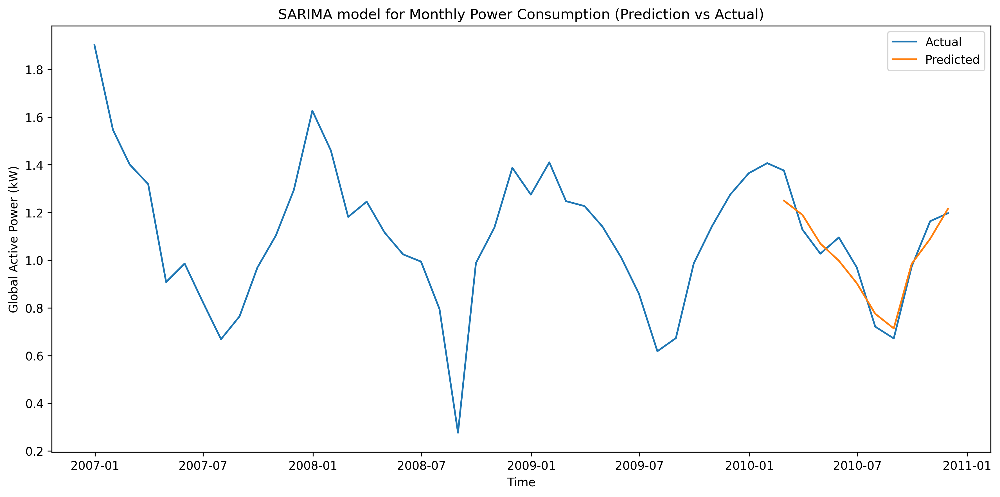


Train MAE: 0.194
Train MAPE: 0.208
Train MSE: 0.133
Train RMSE: 0.365

Test MAE: 0.059
Test MAPE: 0.057
Test MSE: 0.005
Test RMSE: 0.068


In [ ]:
# Seasonal ARIMA model
Seasonal_ARIMA_model = SARIMAX(train_df3, order=(8,0,0), seasonal_order=(1,0,1,12))
Seasonal_ARIMA_model_fit = Seasonal_ARIMA_model.fit()
pred_train = Seasonal_ARIMA_model_fit.predict(start=train_df3.index[0], end=train_df3.index[-1])
pred_test = Seasonal_ARIMA_model_fit.predict(start=test_df3.index[0], end=test_df3.index[-1])

#  Plot the results for Seasonal ARIMA model
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(df3.Global_active_power, label='Actual')
plt.plot(pred_test, label='Predicted')
plt.title('SARIMA model for Monthly Power Consumption (Prediction vs Actual)')
plt.xlabel('Time')
plt.ylabel('Global Active Power (kW)')
plt.legend()
plt.tight_layout()
plt.show()

# Calculate evaluation metrics for Seasonal ARIMA model
print(f'\nTrain MAE: {mean_absolute_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train MAPE: {mean_absolute_percentage_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train MSE: {mean_squared_error(train_df3.Global_active_power, pred_train):.3f}')
print(f'Train RMSE: {np.sqrt(mean_squared_error(train_df3.Global_active_power, pred_train)):.3f}')

print(f'\nTest MAE: {mean_absolute_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test MAPE: {mean_absolute_percentage_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test MSE: {mean_squared_error(test_df3.Global_active_power, pred_test):.3f}')
print(f'Test RMSE: {np.sqrt(mean_squared_error(test_df3.Global_active_power, pred_test)):.3f}')